In [1]:
import json
import pickle
from gensim.models import LdaModel
from gensim.corpora import Dictionary

from scipy.sparse import coo_matrix, csr_matrix, lil_matrix, csc_matrix, diags, vstack
from scipy.stats import chi2_contingency, spearmanr, norm

from matplotlib import pyplot as plt
from IPython.display import HTML, display
import pandas as pd
import numpy as np
import random
from datetime import date
from matplotlib.dates import DateFormatter

In [2]:
politics_dictionary = Dictionary.load("stored_variables/politics_dictionary_lda")

In [3]:
sanders_tf_by_month = []
trump_tf_by_month = []

In [4]:
for i in range(24):
    print(i)
        
    with open("stored_variables/politics_sanders_tf" + str(i) + ".pickle", 'rb') as f:
        sanders_tf_by_month.append(pickle.load(f))
        
    with open("stored_variables/politics_trump_tf" + str(i) + ".pickle", 'rb') as f:
        trump_tf_by_month.append(pickle.load(f))


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


In [5]:
trump_words = ['donald','trump','drumpf']
sanders_words = ['bernie','sanders','sander']
clinton_words = ['hillary','hilary','clinton','hrc']

immigration_words = ['immigrant','immigrants', 'immigration', 
                     'illegals', 'aliens', 'mexican', 'mexicans', 
                     'undocumented', 'amnesty', 'deportation', 
                     'deporting', 'visas', 'migrants', 'visa', 
                     'border', 'deportations', 'h1b', 'alien', 
                     'foreigners', 'mexico', 'overstayed', 
                     'muslims', 'overstaying', 'crossings', 
                     'citizenship', 'assimilation', 'migration', 
                     'immigrating', 'natives', 'overstay', 'muslim', 
                     'deport', 'refugees', 'refugee', 'deports', 
                     'deported', 'cubans', 'immigrate', 
                     'latinos', 'hispanics', 'entering', 
                     'asians', 'migrant']

healthcare_words = ['healthcare','health','medicare','insurance',
                   'medicaid', 'uninsured', 'deductibles', 'insurers', 
                    'copays', 'hmo', 'reimbursements', 'insurances', 
                    'premiums', 'insured', 'dental', 'reimbursement', 
                    'nhs', 'supplemental', 'preventative', 'hospitals', 
                    'obamacare', 'insurer', 'medical', 'overhead', 
                    'aca','checkups', 'enrollees', 
                    'patients', 'socialized', 'prescriptions', 'wellness', 
                    'medicine', 'physicians', 'heathcare', 'deductible', 
                    'preventive', 'medication', 'medicade', 'heath']

campaign_words = ["campaign","election", "elections", "campaigns", "vote", "voting", 
                  'primary', 'primaries', 'votes', 'candidate', 'challengers', 'caucus', 
                  'incumbents', 'candidates', 'voters', 'challenger', 'nomination', 'nominee', 
                  'party', 'caucuses', 'ballot', 'dnc', 'superdelegates',  
                  'independents', 'endorsements', 'campaigning', 'reelection', 'dems', 
                  'fundraising', 'voter', 'contests', 'november', 'electorate', 'debates', 
                  'incumbent', 'enthusiasm', 'presidency', 'midterm', 'contest', 
                  'ticket', 'democrats', 'turnout', 'midterms']

gun_words = ['handguns', 'handgun', 'concealed', 'ccw', 'weapon', 
             'rifles', 'pistols', 'suppressors', 'ammunition', 'automatics',
             'atf', 'silencers', 'ammo', 'hunters', 'robberies', 'pistol', 
             'lethal', 'rifle', 'shotguns', 'homicides', 'shooters', 
             'suppressor', 'ar15s', 'homicide', 'fingerprint', 'weapons', 
             'hunting', 'knives', 'buyback', 'ffls', 'explosives']

In [6]:
def subset_with_words(mat, word_list):
    idx_list = [politics_dictionary.token2id[word] for word in word_list]
    
    user_ids = np.nonzero(mat[:,idx_list].sum(axis=1))[0]
    
    return mat[user_ids, :]

In [7]:
word_sets = [trump_words, sanders_words, clinton_words, immigration_words, healthcare_words, campaign_words, gun_words]

In [8]:
word_set_names = ['Trump', 'Sanders', 'Clinton', 'Immigration', 'Healthcare', 'Campaigns', 'Guns']

In [9]:
sanders_tf_subsets = []
trump_tf_subsets = []

In [10]:
for i in range(len(sanders_tf_by_month)):
    curr_sanders_subsets = []
    curr_trump_subsets = []
    
    for ws in word_sets:
        curr_sanders_subsets.append(subset_with_words(sanders_tf_by_month[i], ws))
        curr_trump_subsets.append(subset_with_words(trump_tf_by_month[i], ws))
        
    sanders_tf_subsets.append(curr_sanders_subsets)
    trump_tf_subsets.append(curr_trump_subsets)

In [23]:
months = [date(2015, i, 1) for i in range(1,13)] + [date(2016, i, 1) for i in range(1,13)]

Trump


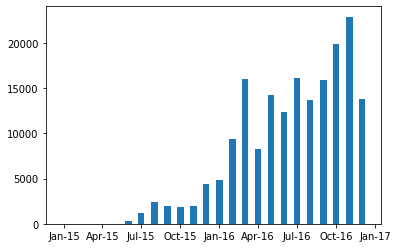

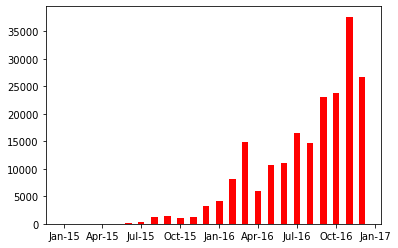

Sanders


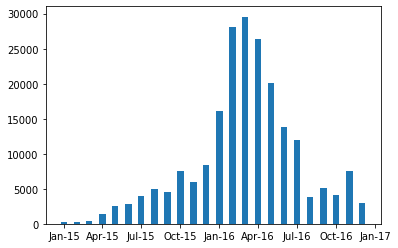

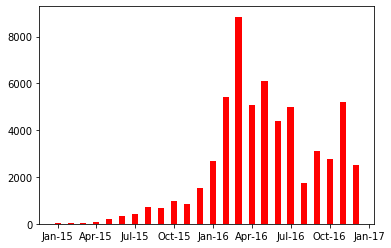

Clinton


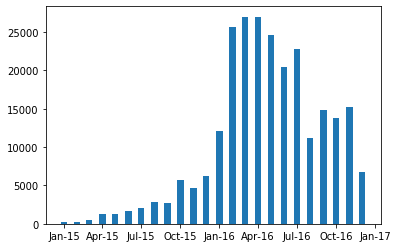

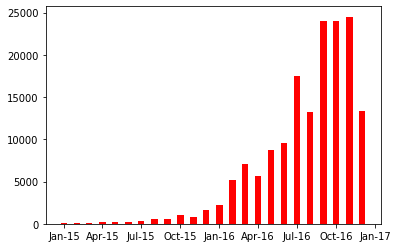

Immigration


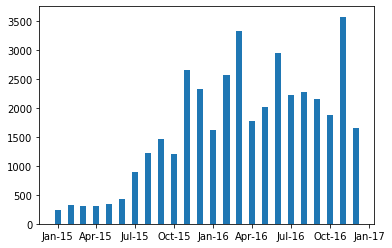

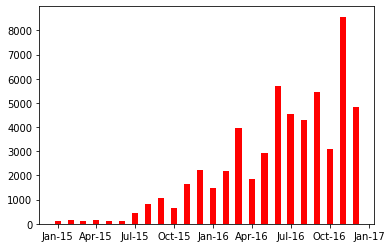

Healthcare


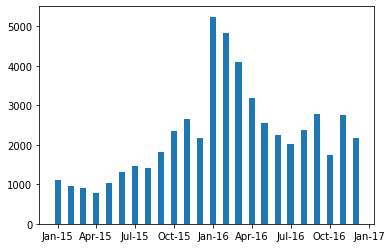

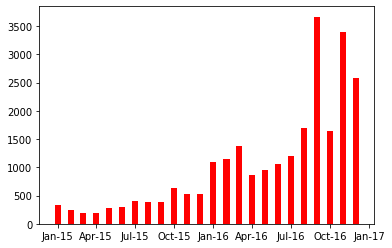

Campaigns


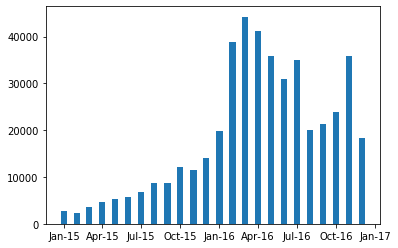

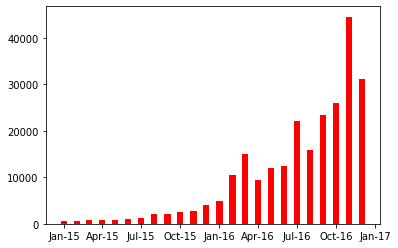

Guns


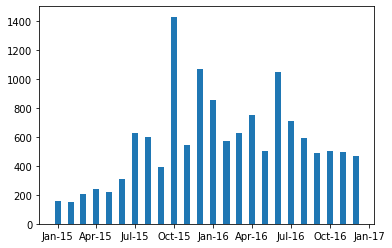

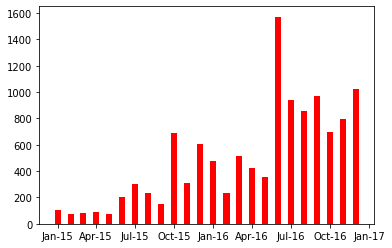

In [29]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    
    fig, ax = plt.subplots()
    ax.bar(months, [mats[j].shape[0] for mats in sanders_tf_subsets],width=15)
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

    plt.show()
    fig, ax = plt.subplots()
    ax.bar(months, [mats[j].shape[0] for mats in trump_tf_subsets],width=15, color='red')
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

    plt.show()

Trump


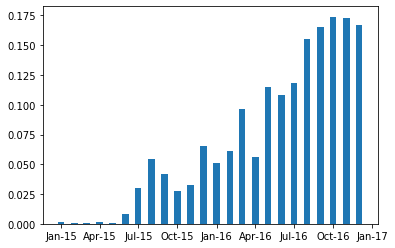

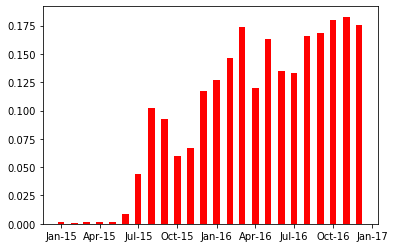

Sanders


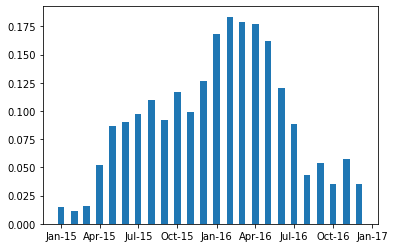

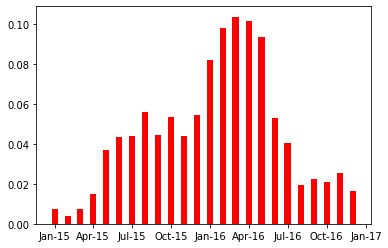

Clinton


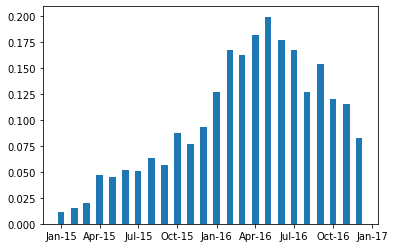

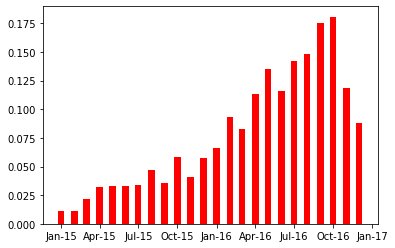

Immigration


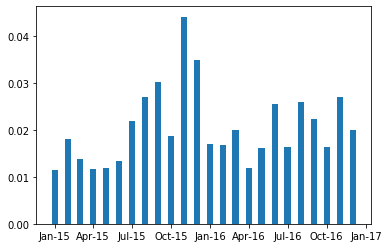

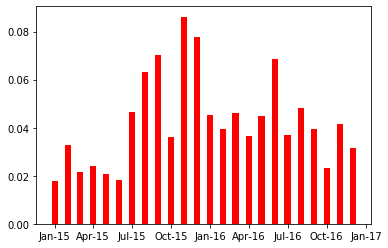

Healthcare


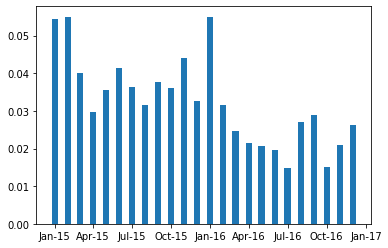

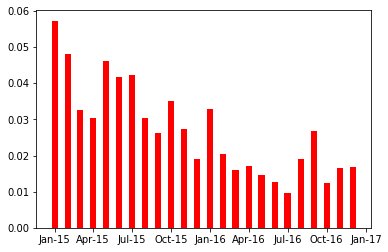

Campaigns


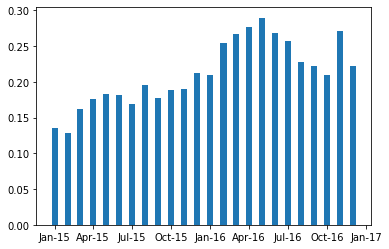

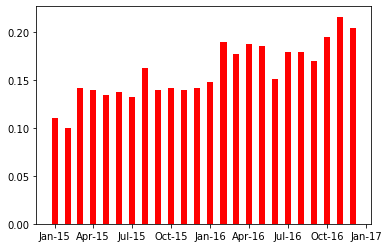

Guns


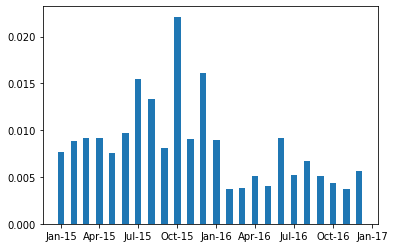

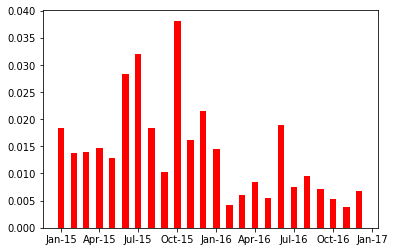

In [30]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    
    fig, ax = plt.subplots()
    ax.bar(months, [sanders_tf_subsets[i][j].shape[0] / sanders_tf_by_month[i].shape[0] 
                    for i in range(len(sanders_tf_subsets))],width=15)
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

    plt.show()
    fig, ax = plt.subplots()
    ax.bar(months, [trump_tf_subsets[i][j].shape[0] / trump_tf_by_month[i].shape[0] 
                    for i in range(len(trump_tf_subsets))],width=15, color='red')
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

    plt.show()

In [21]:
# from https://github.com/ddemszky/framing-twitter/blob/master/3_polarization_measures/calculate_polarization_simple.py
def get_party_q(party_counts, exclude_user_id = -1):
    user_sum = party_counts.sum(axis=0)
    if exclude_user_id > -1:
        user_sum -= party_counts[exclude_user_id, :]
    total_sum = user_sum.sum()
    return user_sum / total_sum

def get_rho(dem_q, rep_q):
    denom = dem_q + rep_q
    denom[denom == 0] = 1
    return (rep_q / (denom)).transpose()

def calculate_polarization(dem_counts, rep_counts, sample_size = 1000):
    dem_no = dem_counts.shape[0]
    rep_no = rep_counts.shape[0]
    
    if sample_size < dem_no:
        dem_indices = random.sample(range(dem_no), sample_size)
        dem_counts = dem_counts[dem_indices, :]
        dem_no = sample_size
        
    if sample_size < rep_no:
        rep_indices = random.sample(range(rep_no), sample_size)
        rep_counts = rep_counts[rep_indices, :]
        rep_no = sample_size
        
    
    dem_user_total = dem_counts.sum(axis=1)
    rep_user_total = rep_counts.sum(axis=1)
    
    # equivalent to dem_counts / dem_user_total
    dem_user_distr = (diags(1 / dem_user_total.A.ravel())).dot(dem_counts)  # get row-wise distributions
    rep_user_distr = (diags(1 / rep_user_total.A.ravel())).dot(rep_counts)
    assert (set(dem_user_total.nonzero()[0]) == set(range(dem_no)))  # make sure there are no zero rows
    assert (set(rep_user_total.nonzero()[0]) == set(range(rep_no)))  # make sure there are no zero rows

    dem_q = get_party_q(dem_counts)
    rep_q = get_party_q(rep_counts)

    # apply measures via leave-out
    dem_addup = 0
    rep_addup = 0
    
    for i in range(dem_no):
        dem_leaveout_q = get_party_q(dem_counts, i)
        token_scores_dem = 1. - get_rho(dem_leaveout_q, rep_q)
        dem_addup += dem_user_distr[i, :].dot(token_scores_dem)[0, 0]
    
    for i in range(rep_no):
        rep_leaveout_q = get_party_q(rep_counts, i)
        token_scores_rep = get_rho(dem_q, rep_leaveout_q)
        rep_addup += rep_user_distr[i, :].dot(token_scores_rep)[0, 0]
    rep_val = 1 / rep_no * rep_addup
    dem_val = 1 / dem_no * dem_addup
    return 1/2 * (dem_val + rep_val)


In [22]:
def pi_val_confidence_interval(lst, estimate, t_k = 50, t_full = 5000):
    assert(len(lst) == 100)
    
    pi_k_lst = sorted(lst)
    pi_avg = np.mean(pi_k_lst)
    q_k = [np.sqrt(t_k) * (pi_k - pi_avg) for pi_k in pi_k_lst]
    
    return (estimate - q_k[89] / np.sqrt(t_full), estimate - q_k[10] / np.sqrt(t_full))

In [50]:
pi_vals = []
pi_vals_ci_below = []
pi_vals_ci_above = []

In [51]:
for i in range(24):
    print(i)
    pi_vals_curr = []
    pi_vals_ci_below_curr = []
    pi_vals_ci_above_curr = []
    
    for j in range(len(word_sets)):
        sanders_mat = sanders_tf_subsets[i][j][sanders_tf_subsets[i][j].sum(axis=1).nonzero()[0],:]
        trump_mat = trump_tf_subsets[i][j][trump_tf_subsets[i][j].sum(axis=1).nonzero()[0],:]

        pi = calculate_polarization(sanders_mat, trump_mat, sample_size=5000)

        pi_vals_curr.append(pi)

        subsample = []

        for _ in range(100):
            subsample.append(calculate_polarization(sanders_mat, trump_mat, sample_size=50))
        
        below, above = pi_val_confidence_interval(subsample, pi, t_k=50, t_full=5000)
        
        pi_vals_ci_below_curr.append(below)
        pi_vals_ci_above_curr.append(above)
        
    pi_vals.append(pi_vals_curr)
    pi_vals_ci_below.append(pi_vals_ci_below_curr)
    pi_vals_ci_above.append(pi_vals_ci_above_curr)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


In [ ]:
pi_vals_gun = []
pi_vals_ci_below_gun = []
pi_vals_ci_above_gun = []

In [ ]:
for i in range(24):
    print(i)
    pi_vals_curr = []
    pi_vals_ci_below_curr = []
    pi_vals_ci_above_curr = []
    
    j = -1
    
    sanders_mat = sanders_tf_subsets[i][j][sanders_tf_subsets[i][j].sum(axis=1).nonzero()[0],:]
    trump_mat = trump_tf_subsets[i][j][trump_tf_subsets[i][j].sum(axis=1).nonzero()[0],:]

    pi = calculate_polarization(sanders_mat, trump_mat, sample_size=5000)

    pi_vals_curr.append(pi)

    subsample = []

    for _ in range(100):
        subsample.append(calculate_polarization(sanders_mat, trump_mat, sample_size=50))

    below, above = pi_val_confidence_interval(subsample, pi, t_k=50, t_full=5000)

    pi_vals_ci_below_curr.append(below)
    pi_vals_ci_above_curr.append(above)
        
    pi_vals.append(pi_vals_curr)
    pi_vals_ci_below.append(pi_vals_ci_below_curr)
    pi_vals_ci_above.append(pi_vals_ci_above_curr)

In [52]:
# with open("stored_variables/pi_vals_topic.pickle", 'wb') as f:
#         pickle.dump(pi_vals, f)
        
# with open("stored_variables/pi_vals_topic_ci_below.pickle", 'wb') as f:
#         pickle.dump(pi_vals_ci_below, f)
        
# with open("stored_variables/pi_vals_topic_ci_above.pickle", 'wb') as f:
#         pickle.dump(pi_vals_ci_above, f)

In [94]:
with open("stored_variables/pi_vals_random_topic.pickle", 'rb') as f:
    pi_vals_random = pickle.load(f)
    
with open("stored_variables/pi_vals_random_topic_ci_below.pickle", 'rb') as f:
    pi_vals_random_ci_below = pickle.load(f)
        
with open("stored_variables/pi_vals_random_topic_ci_above.pickle", 'rb') as f:
    pi_vals_random_ci_above = pickle.load(f)

Trump


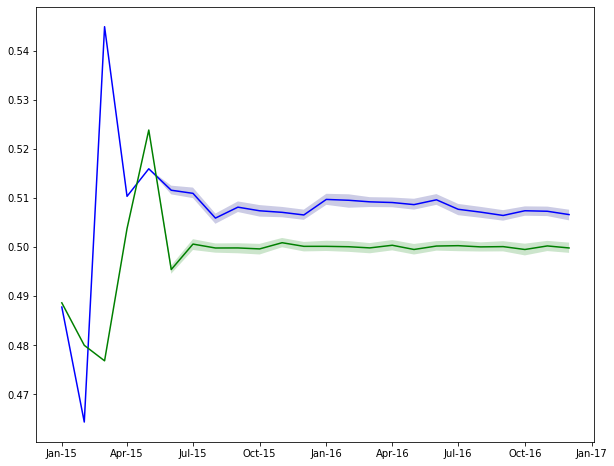

In [104]:
print(word_set_names[0])
fig, ax = plt.subplots(figsize=(10,8))
ax.plot_date(months, [x[0] for x in pi_vals], linestyle = '-', marker=None, color='blue')
ax.fill_between(months, [x[0] for x in pi_vals_ci_below], [x[0] for x in pi_vals_ci_above], facecolor=(0,0,0.5,0.2), interpolate=True)

ax.plot_date(months, [x[0] for x in pi_vals_random], linestyle = '-', marker=None, color='green')
ax.fill_between(months, [x[0] for x in pi_vals_random_ci_below], [x[0] for x in pi_vals_random_ci_above], facecolor=(0,0.5,0,0.2), interpolate=True)
ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

plt.show()

In [114]:
[1,2,3][0:]

[1, 2, 3]

Trump


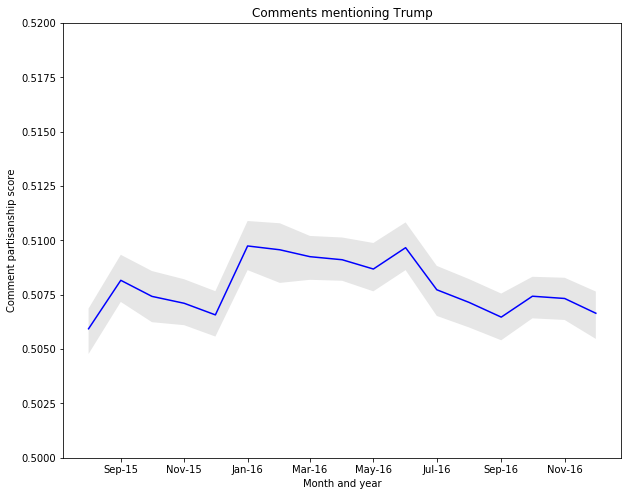

Sanders


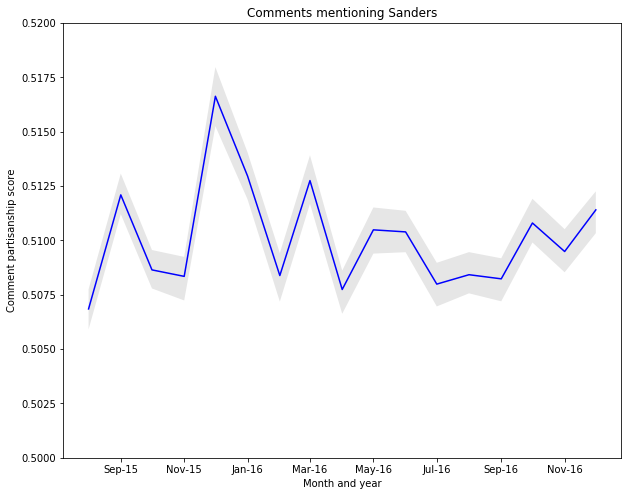

Clinton


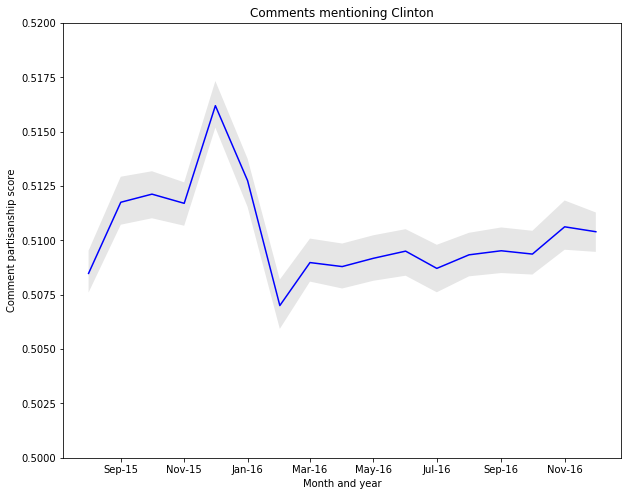

Immigration


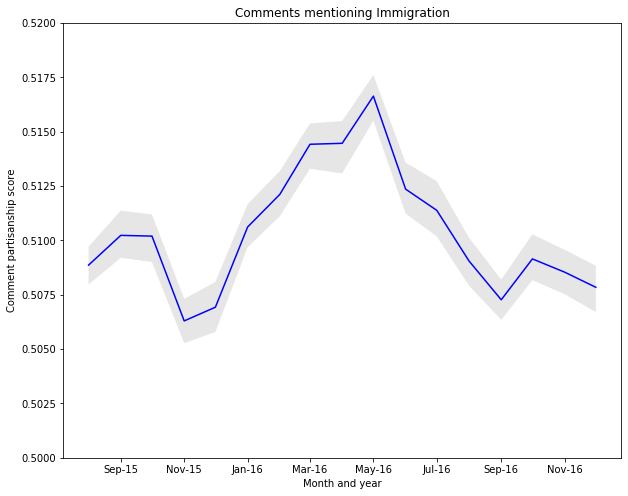

Healthcare


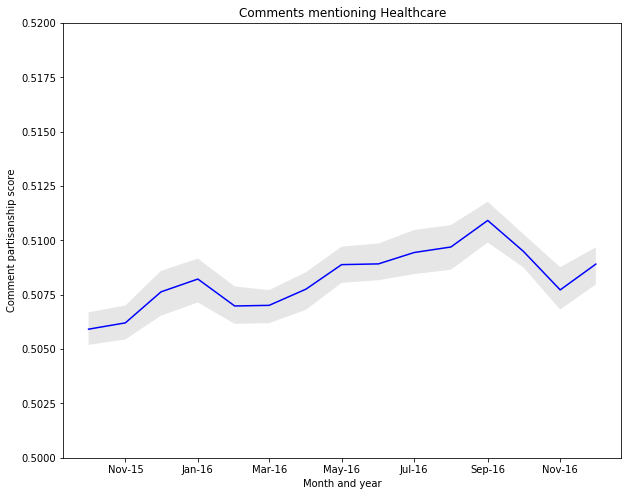

Campaigns


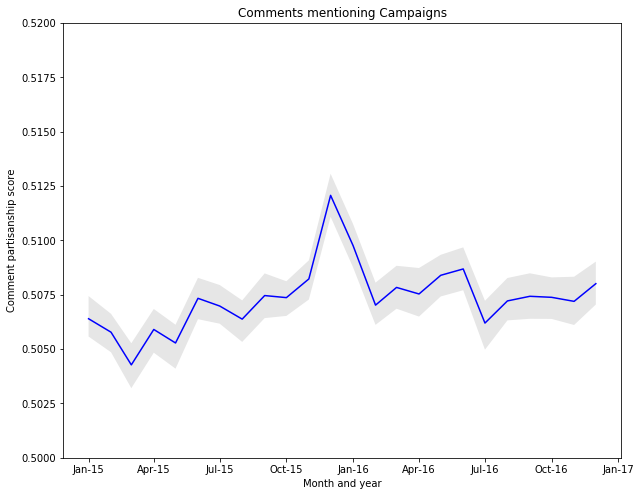

Guns


In [130]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    num_comments_min = 500
    num_comments_observed = [min(sanders_tf_subsets[i][j].shape[0], trump_tf_subsets[i][j].shape[0]) for i in range(24)]
    bad_months = [i for i in range(24) if num_comments_observed[i] < num_comments_min]
    cutoff = 0
    if len(bad_months) > 0:
        cutoff = bad_months[-1] + 1
        
    if cutoff >= 23:
        continue
    
    fig, ax = plt.subplots(figsize=(10,8))
    ax.plot_date(months[cutoff:], [x[j] for x in pi_vals][cutoff:], linestyle = '-', marker=None, color='blue')
    ax.fill_between(months[cutoff:], [x[j] for x in pi_vals_ci_below][cutoff:], [x[j] for x in pi_vals_ci_above][cutoff:], facecolor='0.9', interpolate=True)
    
#     ax.plot_date(months[cutoff:], [x[j] for x in pi_vals_random][cutoff:], linestyle = '-', marker=None, color='green')
#     ax.fill_between(months[cutoff:], [x[j] for x in pi_vals_random_ci_below][cutoff:], [x[j] for x in pi_vals_random_ci_above][cutoff:], facecolor=(0,0.5,0,0.2), interpolate=True)
    
    plt.ylim((0.5, 0.52))
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))
    plt.xlabel('Month and year')
    plt.ylabel('Comment partisanship score')
    plt.title('Comments mentioning ' + word_set_names[j])

    plt.show()

Trump


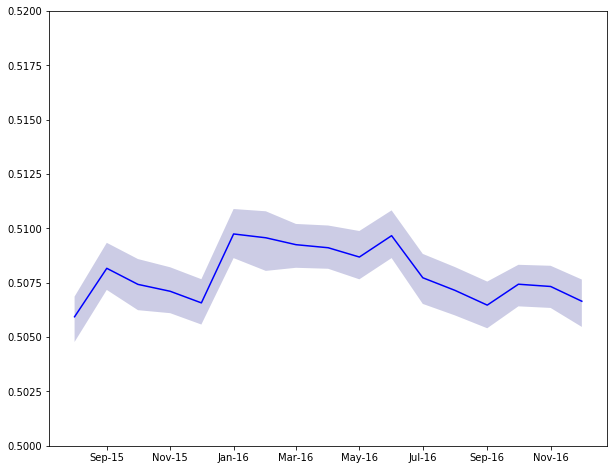

Sanders


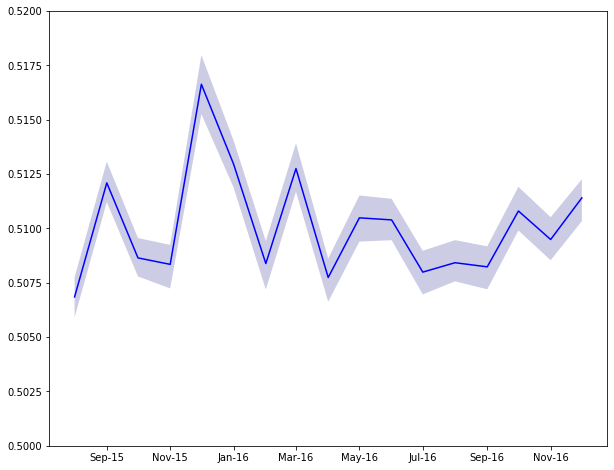

Clinton


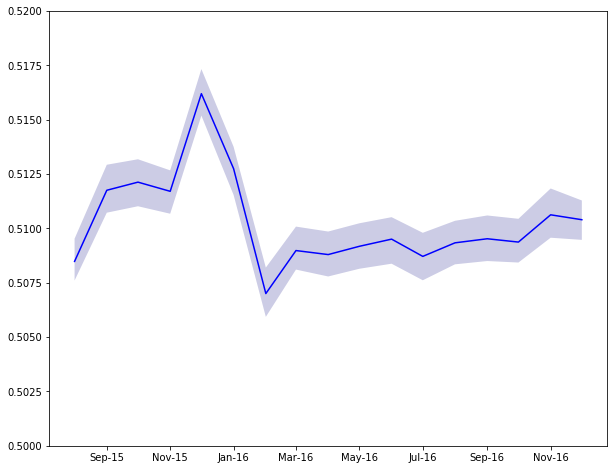

Immigration


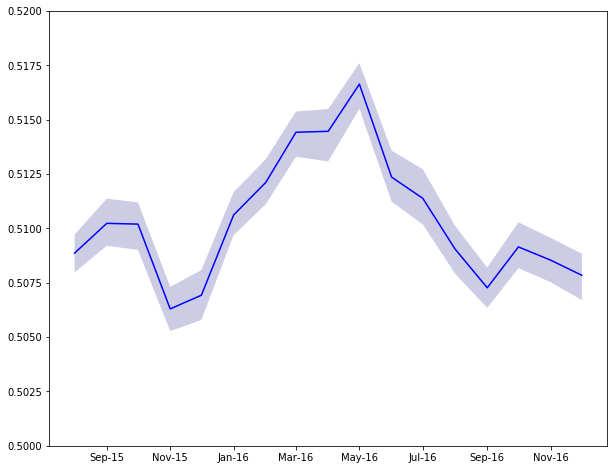

Healthcare


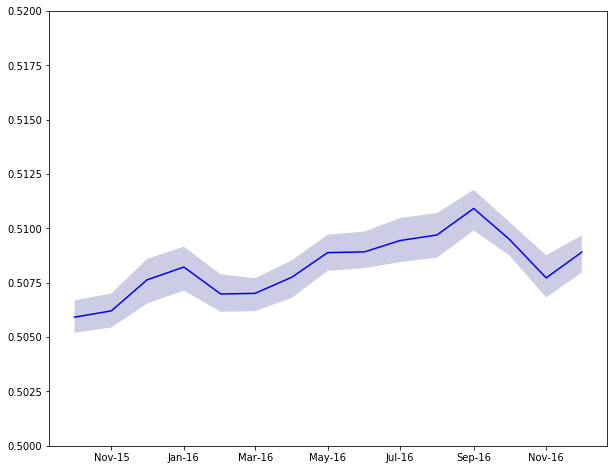

Campaigns


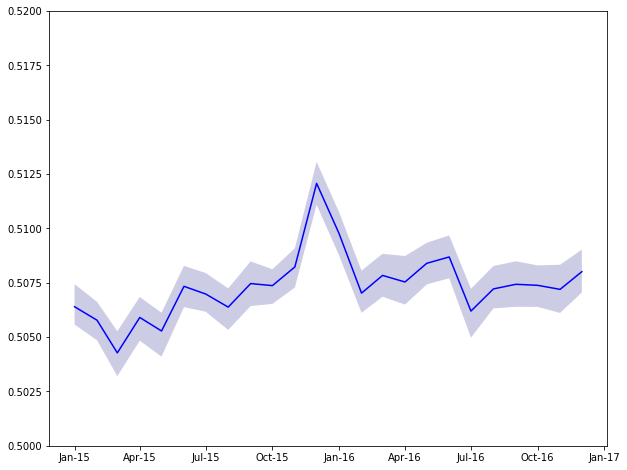

Guns


In [117]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    num_comments_min = 500
    num_comments_observed = [min(sanders_tf_subsets[i][j].shape[0], trump_tf_subsets[i][j].shape[0]) for i in range(24)]
    bad_months = [i for i in range(24) if num_comments_observed[i] < num_comments_min]
    cutoff = 0
    if len(bad_months) > 0:
        cutoff = bad_months[-1] + 1
        
    if cutoff >= 23:
        continue
    
    fig, ax = plt.subplots(figsize=(10,8))
    ax.plot_date(months[cutoff:], [x[j] for x in pi_vals][cutoff:], linestyle = '-', marker=None, color='blue')
    ax.fill_between(months[cutoff:], [x[j] for x in pi_vals_ci_below][cutoff:], [x[j] for x in pi_vals_ci_above][cutoff:], facecolor=(0,0,0.5,0.2), interpolate=True)
    
#     ax.plot_date(months[cutoff:], [x[j] for x in pi_vals_random][cutoff:], linestyle = '-', marker=None, color='green')
#     ax.fill_between(months[cutoff:], [x[j] for x in pi_vals_random_ci_below][cutoff:], [x[j] for x in pi_vals_random_ci_above][cutoff:], facecolor=(0,0.5,0,0.2), interpolate=True)
    
    plt.ylim((0.5, 0.52))
    ax.xaxis.set_major_formatter(DateFormatter('%b-%y'))

    plt.show()

## Word choice

In [55]:
# adapted from https://github.com/jmhessel/FightingWords/blob/master/fighting_words.py
def fightin_words(mat1, mat2, prior = 1):
    vocab_size = mat1.shape[0]
    priors = np.array([prior for i in range(vocab_size)])
    
    z_scores = np.empty(vocab_size)
    a0 = np.sum(priors)
    n1 = 1.*np.sum(mat1)
    n2 = 1.*np.sum(mat2)

    for i in range(vocab_size):
        #compute delta
        term1 = np.log((mat1[i] + priors[i])/(n1 + a0 - mat1[i] - priors[i]))
        term2 = np.log((mat2[i] + priors[i])/(n2 + a0 - mat2[i] - priors[i]))        
        delta = term1 - term2
        #compute variance on delta
        var = 1./(mat1[i] + priors[i]) + 1./(mat2[i] + priors[i])
        #store final score
        z_scores[i] = delta/np.sqrt(var)
    sorted_indices = np.argsort(z_scores)
    return_list = []
    for i in sorted_indices:
        return_list.append((politics_dictionary.id2token[i], i, z_scores[i]))
        
    return return_list

In [11]:
def fightin_words_unsorted(mat1, mat2, prior = 1):
    vocab_size = mat1.shape[0]
    priors = np.array([prior for i in range(vocab_size)])
    
    z_scores = np.empty(vocab_size)
    a0 = np.sum(priors)
    n1 = 1.*np.sum(mat1)
    n2 = 1.*np.sum(mat2)

    for i in range(vocab_size):
        #compute delta
        term1 = np.log((mat1[i] + priors[i])/(n1 + a0 - mat1[i] - priors[i]))
        term2 = np.log((mat2[i] + priors[i])/(n2 + a0 - mat2[i] - priors[i]))        
        delta = term1 - term2
        #compute variance on delta
        var = 1./(mat1[i] + priors[i]) + 1./(mat2[i] + priors[i])
        #store final score
        z_scores[i] = delta/np.sqrt(var)
#     sorted_indices = np.argsort(z_scores)
    return_list = []
    for i in range(len(z_scores)):
        return_list.append(z_scores[i])
        
    return return_list

In [18]:
def vocab_loss(count_r, count_d):
    sum_r = sum(count_r)
    sum_d = sum(count_d)
    q_r = count_r / sum_r
    q_d = count_d / sum_d
    rho_denom = q_r + q_d
    rho_denom[rho_denom == 0] = 1
    rho = q_r / rho_denom
    r_denom = 1 - q_r
    d_denom = 1 - q_d
    
    vals = np.zeros(count_r.shape[0])
    
    for j in range(count_r.shape[0]):
        if count_r[j] <= 1 or count_d[j] <= 1:
            vals[j] = 0
        else:
            curr_val = np.sum(((q_r / r_denom[j]) * rho) + ((q_d / d_denom[j]) * rho)) - \
(((q_r[j] / r_denom[j]) * rho[j]) + ((q_d[j] / d_denom[j]) * rho[j]))
            
            vals[j] = 0.5 - (0.5 * curr_val)
            
    return vals

In [21]:
fightin_words_lists = []
polarization_by_month = []

In [22]:
for i in range(24):
    print(i)
    
    fightin_words_curr = []
#     polarization_by_month_curr = []
    
    for j in range(len(word_sets)):
        tmp_sanders = sanders_tf_subsets[i][j].sum(axis=0).A1
        tmp_trump = trump_tf_subsets[i][j].sum(axis=0).A1

        fightin_words_curr.append(fightin_words_unsorted(tmp_trump, tmp_sanders))
#         polarization_by_month_curr.append(vocab_loss(tmp_trump, tmp_sanders))
        
    fightin_words_lists.append(fightin_words_curr)
#     polarization_by_month.append(polarization_by_month_curr)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


In [84]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    for i in range(24):
        print(months[i].strftime('%b %Y'))
        print([politics_dictionary.id2token[k] for k in np.argsort(fightin_words_lists[i][j])[:20]])
        print([politics_dictionary.id2token[k] for k in np.argsort(fightin_words_lists[i][j])[-20:]])
        print()
        print([politics_dictionary.id2token[k] for k in np.argsort(polarization_by_month[i][j])[:20]])
        print([politics_dictionary.id2token[k] for k in np.argsort(polarization_by_month[i][j])[-20:]])
        print()
        

Trump
Jan 2015
['for', 'you', 'not', 't', 'trump', 'be', 'have', 'can', 'because', 'if', 'but', 'we', 'even', 'who', 'he', 'his', 'are', 'one', 'or', 'on']
['bin', 'tariffs', 'institutional', 'noaa', 'xerox', 'stock', 'duties', 'turned', 'post', 'owns', 'controlling', 'systems', 'created', 'algorithms', 'fraud', 'grace', 'results', 'commission', 'money', 'taxes']

['not', 't', 'be', 'we', 'trump', 'if', 'do', 'about', 'or', 'on', 'people', 'up', 've', 'there', 'have', 'would', 'does', 'm', 'where', 'them']
['this', 'us', 'income', 'different', 'cruz', 'new', 'are', 'all', 'data', 'obama', 'make', 'more', 'so', 'no', 'my', 'by', 'than', 'government', 'they', 'when']

Feb 2015
['you', 'not', 't', 'for', 'be', 'people', 'have', 'law', 'if', 'but', 'on', 'they', 'we', 'trump', 'because', 'right', 'government', 'can', 'their', 'don']
['studies', 'advocacy', 'manner', 'call', 'numbers', 'current', 'hardly', 'rosenberg', 'his', 'simulation', 'debunked', 'bad', 'obama', 'year', 'study', 'publi

['you', 'sanders', 'for', 'he', 'not', 't', 'be', 'we', 'are', 'have', 'bernie', 'on', 'this', 'as', 'if', 'with', 'has', 'but', 'they', 'would']
['asian', 'unjust', '1st', 'hopefully', 'improvement', 'meaningful', 'civil', 'stimulus', 'dick', 'international', 'corporatist', 'revenue', 'clout', 'goldman', 'sachs', 'linked', 'developing', 'liberalization', 'responsible', 'ttip']

['not', 'has', 'he', 'you', 'one', 'this', 'if', 'get', 'on', 'socialist', 'we', 'think', 'have', 'our', 'government', 't', 'be', 'right', 'say', 'don']
['everything', 'stand', 're', 'obama', 'as', 'deal', 'tpp', 'which', 'economic', 'their', 'she', 'than', 'both', 'far', 'they', 'more', 'world', 'all', 'or', 'trade']

Feb 2015
['for', 'sanders', 't', 'he', 'be', 'bernie', 'not', 'but', 'if', 'you', 'or', 'as', 'have', 'are', 'would', 'on', 'will', 'we', 'they', 'people']
['greater', 'liquidate', 'upvoting', 'false', 'feed', 'racist', 'con', 'feels', 'children', 'insolvent', 'okay', 'media', 'post', 'went', 'po

['constitution', 'economics', 'companies', 'serious', 'bloat', 'funds', 'tax', 'government', 'paul', 'goldman', 'sachs', 'risk', 'revenue', 'period', 'men', 'tariffs', 'american', 'excise', 'taxes', 'corporations']

['was', 'think', 'an', 'be', 'his', 'he', 'bush', 'you', 'conservative', 'by', 'has', 'had', 'at', 'vote', 'party', 'bill', 'for', 'him', 'm', 'would']
['these', 'average', 'pay', 'now', 'this', 'from', 'who', 're', 'so', 'people', 'their', 'more', 'american', 'tax', 'corporations', 'money', 'government', 'are', 'taxes', 'they']

Feb 2015
['t', 'for', 'you', 'he', 'if', 'clinton', 'not', 'but', 'they', 'she', 'be', 'or', 'would', 'hillary', 'with', 'on', 'have', 'are', 'vote', 'was']
['pushed', 'racism', 'environmental', 'numerous', 'vaxxers', 'articles', 'causes', 'ask', 'possible', 'cause', 'including', 'u', 'feb', 'media', 'vaccines', 'sjw', 'destruction', 'iraq', 'waiting', 'weapons']

['if', 't', 'would', 'she', 'or', 'vote', 'he', 'candidate', 'my', 'warren', 'one', '

['clinton', 'she', 'bernie', 'sanders', 'voters', 'but', 'her', 'party', 'for', 'candidate', 'as', 'primary', 'was', 'people', 'democratic', 'vote', 'more', 'we', 'than', 'have']
['me', 'russians', 'said', 'with', 'foundation', 'fake', 'media', 'know', 'if', 'your', 'evidence', 'are', 'news', 'trump', 'emails', 'has', 'this', 'russia', 'you', 'hillary']

Immigration
Jan 2015
['for', 'can', 'there', 'be', 'just', 'with', 'm', 'an', 'my', 'has', 'same', 'or', 'not', 'some', 'does', 'what', 'immigration', 'more', 'on', 'wage']
['premiums', 'program', 'side', 'vaccinated', 'versus', 'financial', 'government', 'rates', 'less', 'outbreaks', 'article', 'screenings', 'did', 'children', 'average', 'money', 'health', 'disease', 'third', 'corporations']

['for', 'can', 'there', 'be', 'just', 'm', 'with', 'an', 'my', 'has', 'same', 'or', 'some', 'does', 'what', 'immigration', 'wage', 'more', 'every', 'go']
['as', 'republican', 'world', 'health', 'right', 'up', 'illegal', 'tax', 'so', 'did', 'he', 

['women', 'sjw', 'hepatitis', 'transmitted', 'playing', 'female', 'gender', 'ss', 'hemp', 'jeb', 'sports', 'athletes', 'cutting', 'paul', 'bush', 'mtf', 'male', 'cut', 'rand', 'competitive']

['health', 'services', 'insurance', 'for', 'which', 'they', 'service', 'single', 'art', 'as', 'no', 'payer', 'would', 'public', 'get', 'because', 'also', 'be', 'free', 'there']
['rand', 'money', 'before', 'we', 'people', 'me', 'an', 'now', 'medical', 'paul', 'with', 'don', 'think', 'who', 't', 'cut', 'was', 'his', 'my', 'he']

Mar 2015
['t', 'you', 'for', 'but', 'are', 'we', 'not', 'be', 'if', 'health', 'this', 'with', 'he', 'have', 'or', 'as', 'would', 'what', 'so', 'was']
['undocumented', 'authority', 'inflation', 'deportation', 'numbers', 'guys', 'executed', 'faithfully', 'illegal', 'shall', 'signing', 'almonds', 'violation', 'govt', 'aliens', 'emtala', 'immigration', 'ii', 'section', 'article']

['but', 'we', 'health', 'if', 't', 'other', 'right', 'then', 'he', 'need', 'education', 'cruz', 'ev

['neocons', 'sales', 'jfk', 'king', 'citizenship', 'elements', 'assault', 'sense', 'peaceful', 'mom', 'accomplishments', 'blacks', 'bans', 'immigration', 'rand', 'weapons', 'racist', 'guns', 'muslim', 'gun']

['sanders', 'bernie', 'he', 'vote', 'not', 'for', 'but', 'candidate', 'be', 'we', 'm', 'hillary', 'win', 'she', 'primaries', 'people', 'primary', 'as', 'campaign', 't']
['over', 'sense', 'their', 'democrats', 'know', 'obama', 'gop', 'shit', 'its', 'or', 'like', 'government', 'with', 'same', 'rand', 'was', 'gun', 'all', 'are', 'they']

May 2015
['for', 'bernie', 'you', 'sanders', 'vote', 't', 'if', 'he', 'on', 'can', 'but', 'not', 'candidate', 'be', 'what', 'this', 'we', 'or', 'campaign', 'at']
['capacity', 'moral', 'feb', 'sept', 'floor', 'frankfurt', 'oct', 'space', 'sen', 'wyden', 'biological', 'nuclear', 'chemical', 'crony', 'unfavorable', 'mass', 'destruction', 'hussein', 'saddam', 'weapons']

['bernie', 'sanders', 'vote', 'candidate', 'if', 'can', 'campaign', 'on', 'for', 'wi

['t', 'deaths', 'home', 'still', 'guns', 'access', 'firearms', 'us', 'rates', 'have', 'gun', 'homicide', 'other', 'carry', 'you', 'what', 'states', 'so', 'they', 'are']

Mar 2015
['an', 'was', 'by', 'be', 'not', 'for', 'or', 'would', 'as', 'with', 'first', 'amendment', 'on', 'but', 'law', 'from', 'church', 'if', 'which', 'this']
['control', 'happen', 'safety', 'thought', 'firearm', 'view', 'seems', 'barrel', 'short', 'value', 'fucked', 'issue', 'petraeus', 'obtaining', 'lawmakers', 'liberals', 'gun', 'violence', 'rifles', 'assault']

['an', 'was', 'by', 'first', 'amendment', 'church', 'law', 'owned', 'or', 'would', 'as', 'act', 'which', 'actually', 'had', 'be', 'get', 'these', 'states', 'whether']
['violence', 'are', 'issue', 'rifles', 'nuclear', 'about', 'ban', 'could', 'us', 'guns', 'them', 'assault', 'weapons', 'don', 'up', 't', 'have', 'gun', 'they', 'you']

Apr 2015
['an', 'by', 'or', 'with', 'amendment', 'first', 'for', 'law', 'church', 'be', 'its', 'was', 'not', 'owned', 'religi

In [90]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    for i in range(24):
        print(months[i].strftime('%b %Y'))
        print(sorted(fightin_words_lists[i][j])[:20])
        print(sorted(fightin_words_lists[i][j])[-20:])
        print()
        print(sorted(polarization_by_month[i][j])[:20])
        print(sorted(polarization_by_month[i][j])[-20:])
        print()

Trump
Jan 2015
[-4.2025305025182895, -3.8324630682600707, -3.8210454366303885, -3.4388875079875922, -3.4290112288539767, -3.305954380692362, -2.9920762380004446, -2.876282542949216, -2.791359838769891, -2.735300406275639, -2.7013514048113243, -2.684615566790489, -2.605628813087118, -2.605628813087118, -2.605628813087118, -2.605628813087118, -2.526495749509447, -2.3938866455781955, -2.384194705681078, -2.384194705681078]
[0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 0.9980981566558363, 1.2881692986009616, 1.2881692986009616, 1.2881692986009616, 1.5184613965179212, 1.5184613965179212, 1.708826140251529, 1.708826140251529, 1.8707579536379364, 1.9931585859561833, 2.1357705460033123]

[-0.0009302887613227284, -0.0005860172444460687, -0.000425431784280228, -0.00040675136745704776, -0.00040142288632460943, -0.0003371451008984394, -0.00027023686625893273, -0.00

[-16.46642230752381, -12.956252644377264, -12.741435838857422, -12.73622695260021, -12.349513830534619, -10.97530335572268, -10.041769945189897, -9.903855065041649, -9.88594985824916, -9.654037408240502, -9.460155496063779, -9.416958784869035, -9.359776679528562, -8.972401895999976, -8.736493329463457, -8.634903725153816, -8.510821039607137, -8.065444293707486, -7.894340067270498, -7.3673112026281515]
[8.764324164696012, 8.804617648490805, 8.845072377158541, 8.969762458207198, 8.980638343844042, 9.258147977878524, 9.270610685434871, 9.466710009365139, 9.671693393681336, 10.171144098882326, 10.216481991477457, 10.477085348884435, 10.669988386650768, 11.09719816896943, 11.527842329225766, 13.030205302930051, 14.134250930195158, 17.035128076735887, 20.219427002211006, 21.437669638215883]

[-0.000582815674043724, -0.0005359621413925097, -0.0003370555786146312, -0.00024805968633112574, -0.00021278262129797998, -0.00019587254702424506, -0.00018795720013609074, -0.0001760352523222375, -0.0001

[0.00013924316471725096, 0.00014835757735753852, 0.0001485792636053973, 0.00014889633541687042, 0.00015384244738164687, 0.00015720779015948594, 0.00016733917151573463, 0.0001747592656883845, 0.00018361434445640645, 0.00018374840268664538, 0.0001954802754152163, 0.0002026364279866244, 0.00020490963253777528, 0.00021107370604916964, 0.00023803439273956117, 0.00024236554653500608, 0.00029222952900787025, 0.0003939490354691877, 0.0005295078967145761, 0.0008711856883724112]

Nov 2015
[-13.846836011871263, -12.360623693789323, -12.005921243592717, -11.783279602157757, -11.106301183712116, -10.697904287861078, -10.559566571057891, -10.422834734295805, -9.422313423816437, -9.304883090384411, -9.250270685506306, -8.9745874285711, -8.926472224554473, -8.6257059839939, -8.619853629203634, -8.604986129968573, -8.088665583947668, -7.815079090671532, -7.672142474758273, -7.596262842315918]
[3.3826736105359276, 3.457646552258536, 3.487947635681312, 3.487947635681312, 3.487947635681312, 3.516586286722

[-0.0003414300416898497, -0.0002973483326079718, -0.0002888769452248363, -0.00027989974246944715, -0.00025257747036877554, -0.00024043605132939572, -0.00023083337858698094, -0.0002293507500265024, -0.0002207397129357913, -0.00019265520413891402, -0.00019202382934879747, -0.00016471869798340144, -0.0001636118147672061, -0.0001587461233351073, -0.00014743746240797329, -0.00014449620031364852, -0.00013441340478359542, -0.0001258926199013688, -0.0001214269370728438, -0.00012075714554116157]
[9.830756858075773e-05, 9.957104585700538e-05, 0.00010268636266319575, 0.0001050591915697785, 0.00010613260977221373, 0.00011221681351980539, 0.00012139058611887465, 0.00012297581197667773, 0.00012522098251005476, 0.00012552203548510388, 0.00013996842175206803, 0.00014885880457421452, 0.00015447985027750022, 0.00017155344126840166, 0.0001732221139967849, 0.0001768220800129061, 0.0004529022150077111, 0.0007804956986891542, 0.0008483311604990385, 0.0008626167770325321]

Dec 2016
[-10.932011573603928, -8.4

[-18.201964983687738, -14.44303682272769, -13.354807720718009, -10.992801128226949, -10.33717723482344, -10.074654035224107, -9.75915067364178, -9.748890273275688, -9.503209906146688, -9.357481651013675, -9.046012547929315, -8.470356742441032, -8.192851829484193, -7.560383823288472, -7.548044270696546, -7.491924131972441, -7.467461507588782, -7.318980683142992, -7.207626893665929, -6.835041041091847]
[4.28546666320034, 4.295282584290231, 4.315569279208266, 4.359204570595753, 4.392977941066557, 4.472965550761686, 4.575863417777935, 4.8982217606585445, 5.016006197567585, 5.118393284467492, 5.124075111086027, 5.205920937147527, 5.260351601746684, 5.5514026894838215, 5.9690011098685005, 6.798644251268703, 6.864503820374377, 8.151958528624247, 10.418227606481514, 22.342624068498708]

[-0.0011776982916921197, -0.0007623005462928933, -0.0006284483763516757, -0.00037945136457295803, -0.00037058567480019455, -0.00035172565922902965, -0.00029854735255996356, -0.0002905509104175197, -0.0002517540

[-23.911504308145833, -18.33829550532911, -18.25897869222496, -17.20007738638375, -15.989056418287602, -15.469984107314183, -13.914428368428709, -12.690909634747875, -12.608989867299128, -11.879252367114438, -11.832090704539688, -11.429306947009549, -10.830348632316692, -10.807856233005063, -10.569526737511733, -10.371801469787172, -10.156339319492144, -10.064847469053635, -9.933861036242973, -9.445098473117874]
[8.286139151460315, 8.385624047979455, 8.44334148518719, 8.595482337298046, 8.614763633325701, 8.773987714676059, 9.390979797437835, 9.489101151416195, 9.61064666021965, 9.625471314214545, 9.684493447727963, 10.294524590659393, 10.455253406887975, 10.86425381894171, 11.013583105600281, 11.29530641360704, 12.732731175147736, 13.225476495907387, 16.263231559091036, 28.536399532036082]

[-0.00042988886845229946, -0.0003979852053391797, -0.00038477912313794604, -0.0003836941466782706, -0.00033231277727585606, -0.0003092156706802074, -0.0002784644730829955, -0.0002707511397511686, -

[2.7291022741101285, 2.7527473081021094, 2.80400906003217, 2.814405215569354, 2.831226075832819, 2.8955679425030647, 2.9242950860791, 2.9901669216930427, 2.9901669216930427, 2.999726268202253, 3.046436291699071, 3.2198257339742864, 3.2723757655236696, 3.3241457384328252, 3.3409239212794795, 3.4682380017367147, 3.8793168149812405, 3.909397004867324, 4.220042026952451, 8.030942113209905]

[-0.0002588781961053721, -0.00022273704858299936, -0.00020436781325872122, -0.00019185020082568283, -0.00018209204588526262, -0.0001518888360334536, -0.00014320017599289692, -0.0001345395803840077, -0.00013255314463644918, -0.0001323281996559178, -0.00013004024510565593, -0.00012689925828046622, -0.00012675700093844888, -0.00012549588614729767, -0.0001162324666922343, -0.00011589559417624073, -0.00011562523383690237, -0.00011182474541615584, -0.00011080611529579176, -0.00011077168958351091]
[0.00013387355669175482, 0.00013574258095239156, 0.00013924587318292492, 0.00013941815791901346, 0.000140310492504

[-0.0005533076929495895, -0.0005531472673234727, -0.000550050791418788, -0.0003832070643084995, -0.000360705488278823, -0.00034623193831473387, -0.00028388646804222706, -0.00023849091326133554, -0.0002074975164902959, -0.00020307852454082287, -0.00018102570021072406, -0.0001632211531198413, -0.00015650595576433002, -0.0001510926616974384, -0.00014850025164492298, -0.00013541536234318308, -0.0001334445210459112, -0.0001333073531581963, -0.00012931928123982583, -0.00011895074250400928]
[0.00015428847929421785, 0.00016692563867770627, 0.00016896333654026208, 0.00017971109899367343, 0.00018053313309551733, 0.00018089607351118309, 0.00018586592866226548, 0.00019420081919335752, 0.00022351521465802104, 0.00023718200653355392, 0.00024301553834887857, 0.00024319170691344816, 0.0002904951334992134, 0.0002977310845047043, 0.0003001357106969249, 0.0003413140692206107, 0.0004527850682812251, 0.00045614246528163926, 0.0004892260489895439, 0.0006830404614348584]

May 2016
[-15.117090150912396, -14.0

[0.00010849975716875626, 0.00011394080830579023, 0.00012841266943230956, 0.00013107021860703227, 0.00013301717327535156, 0.0001343595679373366, 0.00014210676705328495, 0.00014412033908062227, 0.0001472609812541159, 0.00015597738835765318, 0.0001593837238241247, 0.0001596771143920761, 0.00016262041119102788, 0.00017053188395521612, 0.00017620151888442237, 0.00020811885019011989, 0.00023963149003430884, 0.0003346618609009755, 0.0005593792229361405, 0.0005914659686340196]

Dec 2016
[-7.864316847811851, -6.484989963397594, -6.246951625172852, -5.545137149352353, -5.182924978552184, -4.261207876392673, -4.119545421159246, -4.091150717300919, -4.057031603973408, -4.003987833109804, -3.977320903050225, -3.946373368078189, -3.8863639654335334, -3.8478418941518266, -3.838013034967296, -3.828785097671459, -3.788136821733006, -3.7725321671459953, -3.746525173175033, -3.6915200498071563]
[5.24076370980982, 5.377753216072714, 5.506183599701807, 5.774143362410417, 5.782600165512957, 5.90923728334822

[3.9536011444898382, 3.99007339050402, 3.99007339050402, 4.042077614659749, 4.08369250616362, 4.154503511852363, 4.453243758222046, 4.563909933920201, 4.6709463519048775, 4.77172157069199, 4.844574716586861, 5.20200206081593, 5.302623030177646, 5.351794546388753, 5.542890726396194, 7.043925439199553, 7.905049297859518, 8.058036863849187, 9.049616205923371, 10.980500242181284]

[-0.0005175377173185502, -0.00033482556205732816, -0.00031139216416697924, -0.00028955596001667416, -0.00028065727649995154, -0.0002432404324422821, -0.00024143208250515524, -0.00023523044263606963, -0.00022633472216693207, -0.00022403719995278681, -0.00021406660831457813, -0.00021318627198496642, -0.00016199580430320548, -0.0001574140642411903, -0.00014954035176728553, -0.0001407851975036012, -0.00013733441399810253, -0.00013713403116843992, -0.00012740058471893967, -0.0001239763721598841]
[0.00010002468738912196, 0.00010198350602880213, 0.00011002911280449945, 0.00011023114970548642, 0.00011118481876054576, 0.0

[4.470170003181626, 4.481535189414978, 4.505595080000713, 4.635823099081485, 4.789381232666243, 4.795859526092083, 4.812733829541641, 5.091951059210098, 5.410553132494318, 5.658788804722058, 5.757558109043184, 5.795384628781285, 5.825168720928341, 6.141195832045466, 6.423140810723205, 6.608153604606365, 7.280463227556254, 8.41173153207424, 10.093174852817853, 13.474062465775562]

[-0.00035709713042952895, -0.0002769846636000439, -0.00025791704792132997, -0.00023229969841387366, -0.00021949122531350618, -0.0002164195906714239, -0.00018836153960244406, -0.00016327594140330692, -0.0001631460396605, -0.00015668612339780896, -0.0001549784130031595, -0.00015490147225583062, -0.00015291126837380098, -0.00014932258033684143, -0.00014207842115410152, -0.0001368127726584234, -0.00011929074660377292, -9.622035631107195e-05, -9.507036732414598e-05, -9.354467513511544e-05]
[9.582610827424398e-05, 9.739932760738368e-05, 9.978813190097968e-05, 0.00010088603027730292, 0.00010140762242444312, 0.0001058

[8.748577370742971e-05, 9.729171724043306e-05, 0.00010154386301924889, 0.00010184034737864556, 0.0001056579330685481, 0.00010685607315186196, 0.00011263482974921413, 0.00011914896564213517, 0.00011987954930575695, 0.0001240841579181473, 0.00013186665311276657, 0.0001503179491287865, 0.00016008124733341011, 0.00016681401865026313, 0.0001828770562073423, 0.00019236370826092308, 0.0002009782952896444, 0.00021232996916520364, 0.0005796261934143399, 0.0008061996420259954]

Sep 2015
[-14.746736781391425, -13.795899060650902, -12.071222435115585, -10.64710206014767, -10.354414356124925, -9.95006072775878, -8.917269260784428, -8.757450365225486, -7.53916770193552, -7.0601658862883045, -6.998921959330842, -6.919572820980217, -6.426749223015493, -6.3848306134127375, -6.219079980169414, -6.026398262702977, -6.024174338226143, -5.971667412688406, -5.948188695157499, -5.921811537245525]
[4.1795920529565835, 4.193852033676501, 4.200793406513388, 4.218033838887771, 4.294349750915282, 4.32501143183429

[-19.566415822478998, -19.22975860871682, -18.60368911512713, -14.240116088275833, -14.227725437888996, -13.610403917176829, -13.19403587335328, -13.099847798276478, -12.945231351431696, -12.654344206464462, -11.586425430213822, -11.369569671060308, -11.23303218750198, -11.17165576893145, -11.003815108337855, -10.28144785609521, -9.493025455989688, -9.199270990871524, -9.138574114224754, -8.961983496517743]
[9.678420474742765, 9.756797283013002, 9.999528662085309, 10.0749955112803, 10.455103944664375, 10.4694952844915, 11.486905773138067, 11.603098289856943, 11.64917807288459, 11.777439001450537, 11.906123569950097, 12.054922803221315, 12.296883331917769, 13.417206501967827, 13.558115393152185, 13.644337223067664, 13.786001270167809, 15.082490300439003, 22.363641906525025, 42.48817259364294]

[-0.0004922841513784748, -0.0004517241666722738, -0.00033774202041003676, -0.00028577612055780133, -0.00026797515112875203, -0.00025186701940094203, -0.00023097276337835648, -0.0002206586326196635

[-29.718472613375297, -29.21631082552118, -25.835701534372095, -23.2252899456806, -20.63756201480516, -19.596468733548214, -16.740451041616907, -15.491670740377536, -15.210746420999397, -15.198029698261903, -14.112238480196874, -13.594669086426478, -13.375051388662891, -12.908049193370132, -12.546991948410357, -12.438853422282353, -11.887713485705227, -11.679563484868241, -11.62332666659003, -11.505492975139875]
[12.106993249164143, 12.794066505252205, 12.90639111660433, 13.287540750236875, 13.320092974952855, 14.149862510815966, 14.153422571874243, 14.225586659281685, 15.38907103612273, 15.456180699112394, 15.536035581518435, 15.571458164418186, 16.02236096351706, 16.124962911493853, 16.353187558394705, 16.542190003682464, 17.373418891047333, 21.48386994334651, 22.818157741605166, 31.99171861650891]

[-0.00033614182895558287, -0.0002965082721695378, -0.0002446059742424733, -0.0002429790568260204, -0.0002392664149055701, -0.000230607303531416, -0.00022494521047822236, -0.00022207032304

[0.0001366122438470896, 0.00013991133075452744, 0.00014299971272146994, 0.00014398543709909228, 0.0001445232601333113, 0.00014993411322827832, 0.0001561736031440164, 0.00015869533229717625, 0.00016401166576957005, 0.00016569935782168033, 0.0001809877973277807, 0.00018926707282307387, 0.00022788290158598512, 0.0002557879407731334, 0.00026398513031195003, 0.0002852928087473394, 0.0003254039257510333, 0.00033123062933876346, 0.0003416465302076843, 0.000976226965553495]

Sep 2016
[-4.374358320676249, -4.288580041694321, -4.032353004855012, -3.956354479544198, -3.7932343632544545, -3.395527421987342, -3.3167388697967852, -3.286489730405315, -3.286489730405315, -3.281953431244911, -3.2670924027188226, -3.191677969540883, -3.159350773346133, -3.144503384152452, -3.0173408518377256, -3.0128112170491055, -2.992973121795638, -2.9760819916394263, -2.854867782288827, -2.8462105103680835]
[4.250120329646295, 4.350645094442903, 4.367846707644108, 4.39229193769292, 4.824515482872971, 4.89576659080619

In [12]:
# adapted from https://gist.github.com/xandaschofield/3c4070b2f232b185ce6a09e47b4e7473
def make_plot(x_vals, y_vals, sig_val, ylab, title):
    cmap = plt.get_cmap('bwr')
    colors = []
    annots = []
    for i, y in enumerate(y_vals):
        if y > sig_val:
            colors.append(cmap(0.999))
            annots.append(politics_dictionary.id2token[i])
        elif y < -sig_val:
            colors.append(cmap(0))
            annots.append(politics_dictionary.id2token[i])
        else:
            colors.append(cmap((y/(2*sig_val)) + 0.5))
            annots.append(None)

    fig, ax = plt.subplots(figsize=(10,8))
    plt.scatter(x_vals, y_vals, c=colors, linewidth=0, cmap = plt.get_cmap('bwr'))
    for i, annot in enumerate(annots):
        if annot is not None:
            ax.annotate(annot, (x_vals[i], y_vals[i]), color=colors[i])
    ax.set_xscale('log')
    plt.ylim((-1.05 * max(np.abs(y_vals)), 1.05 * max(np.abs(y_vals))))
    plt.xlim((10, 2 * max(x_vals)))
    plt.xlabel('Frequency of word, log scale')
    plt.ylabel(ylab)
    plt.title(title)

    
    plt.show()

Trump
Aug 2015


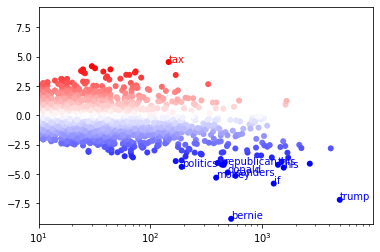

Sep 2015


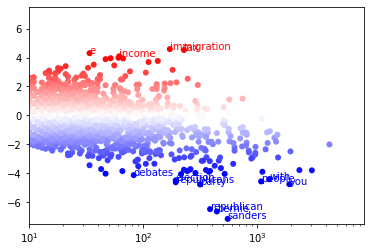

Oct 2015


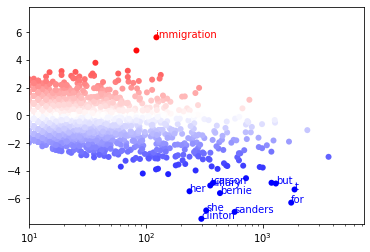

Nov 2015


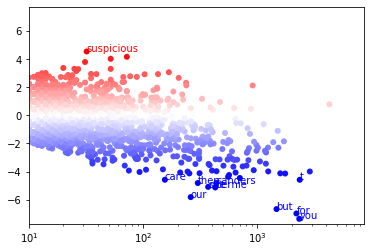

Dec 2015


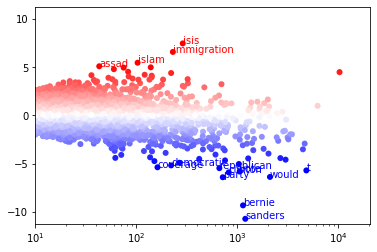

Jan 2016


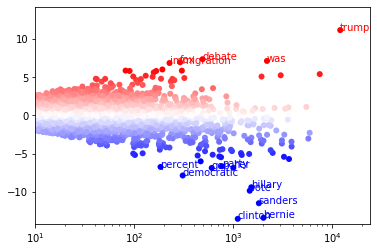

Feb 2016


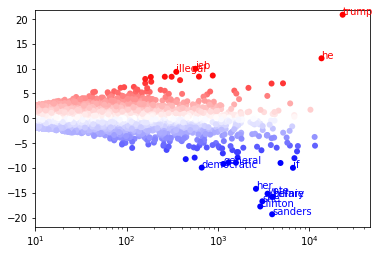

Mar 2016


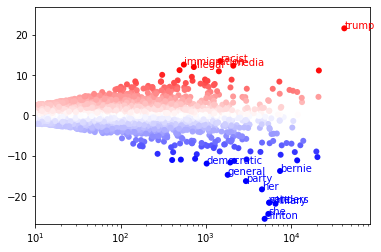

Apr 2016


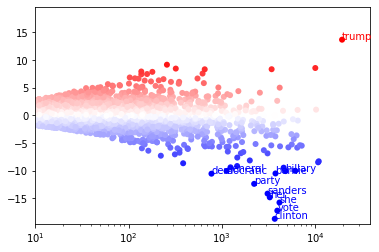

May 2016


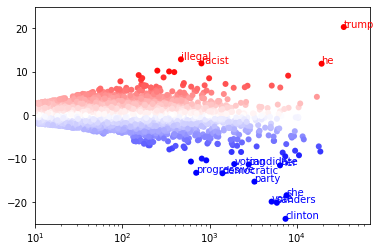

Jun 2016


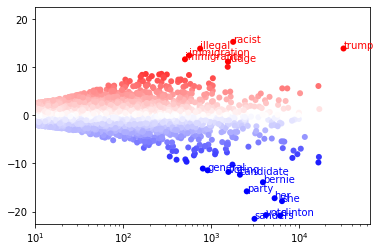

Jul 2016


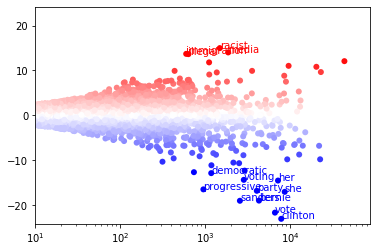

Aug 2016


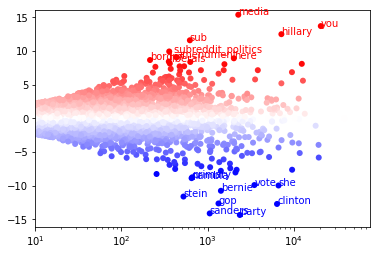

Sep 2016


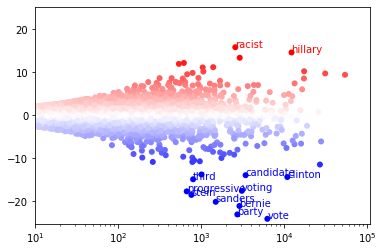

Oct 2016


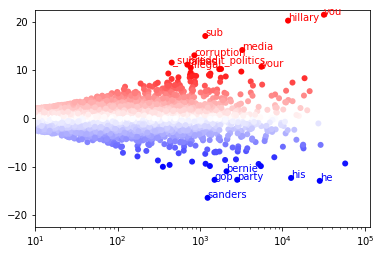

Nov 2016


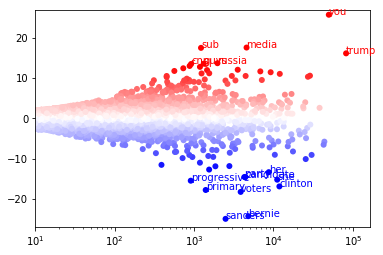

Dec 2016


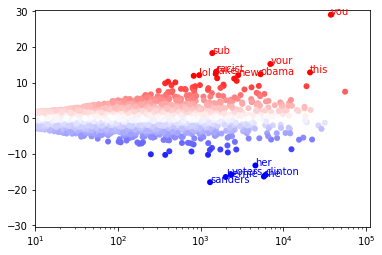

Sanders
Aug 2015


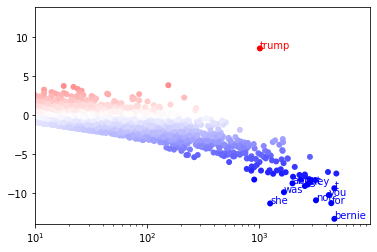

Sep 2015


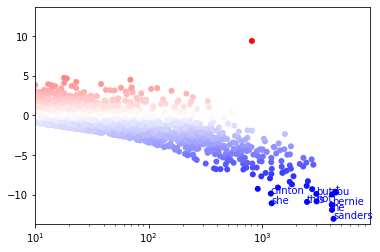

Oct 2015


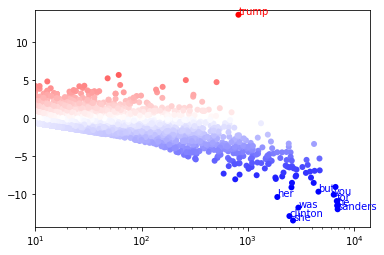

Nov 2015


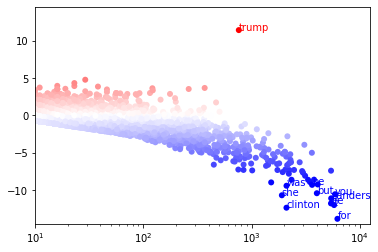

Dec 2015


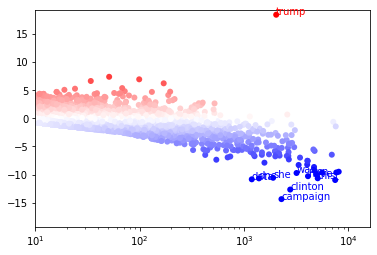

Jan 2016


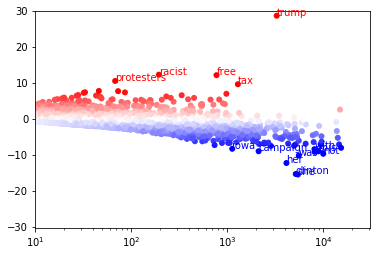

Feb 2016


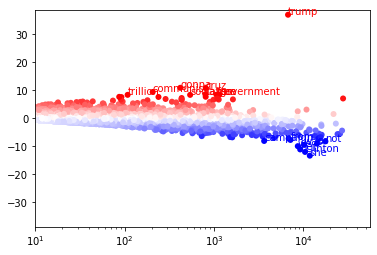

Mar 2016


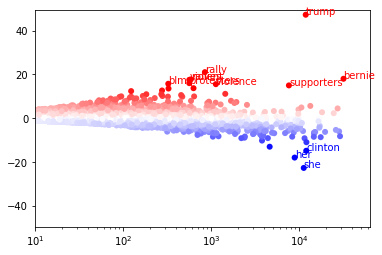

Apr 2016


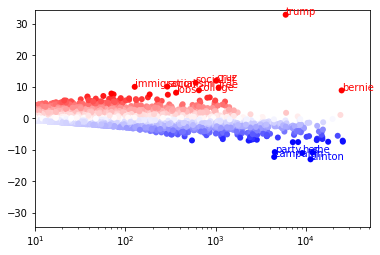

May 2016


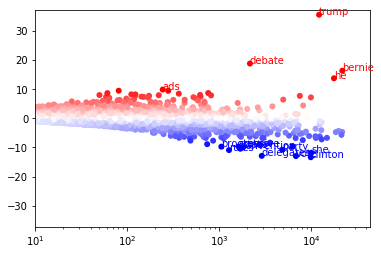

Jun 2016


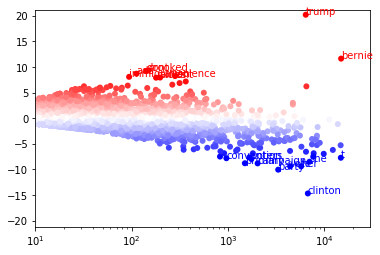

Jul 2016


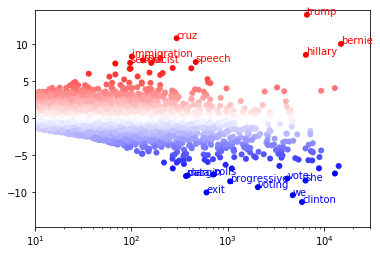

Aug 2016


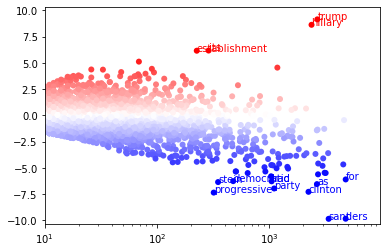

Sep 2016


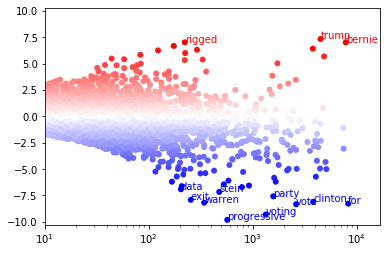

Oct 2016


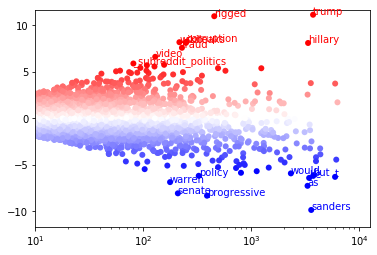

Nov 2016


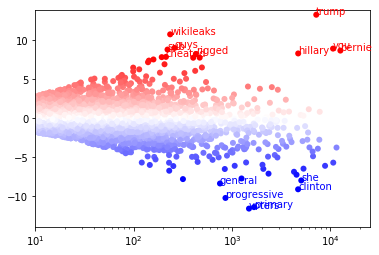

Dec 2016


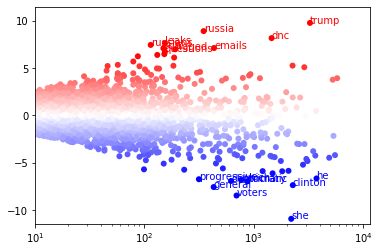

Clinton
Aug 2015


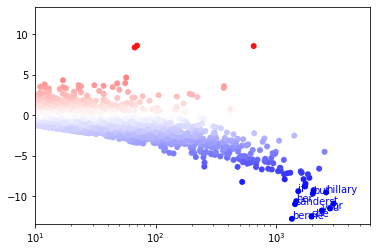

Sep 2015


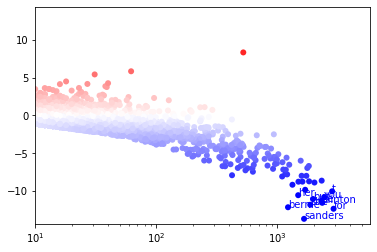

Oct 2015


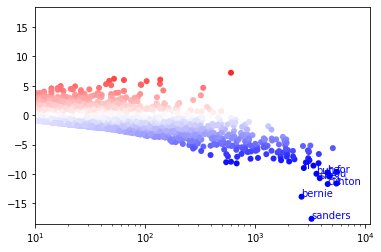

Nov 2015


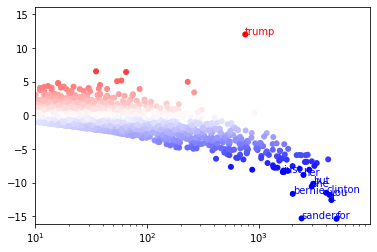

Dec 2015


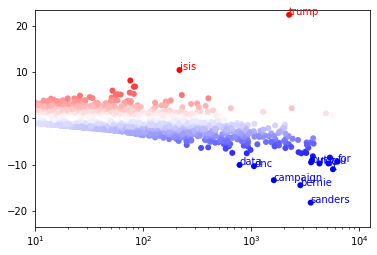

Jan 2016


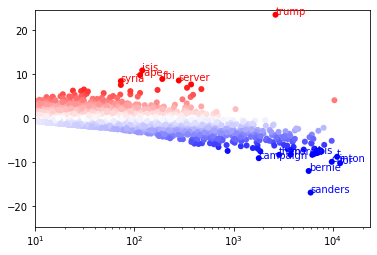

Feb 2016


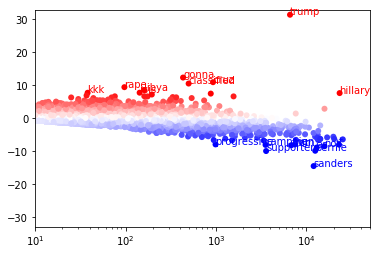

Mar 2016


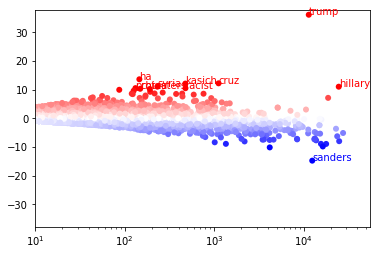

Apr 2016


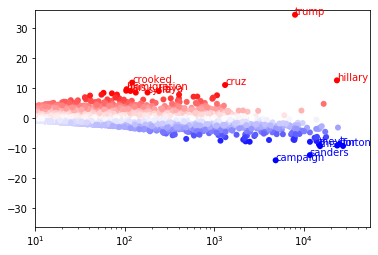

May 2016


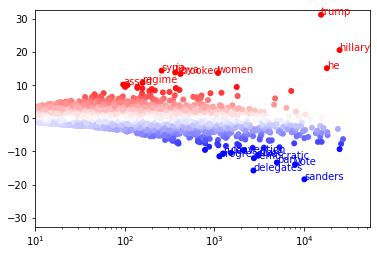

Jun 2016


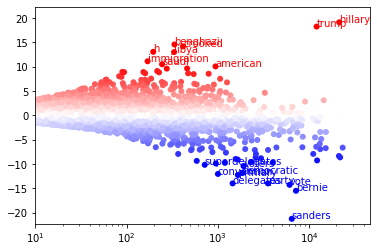

Jul 2016


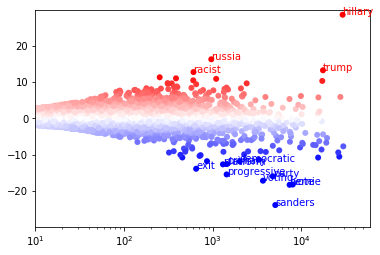

Aug 2016


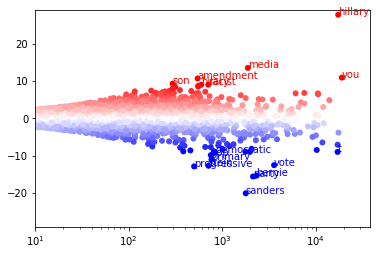

Sep 2016


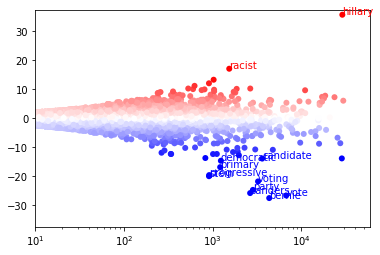

Oct 2016


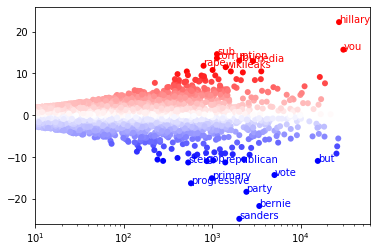

Nov 2016


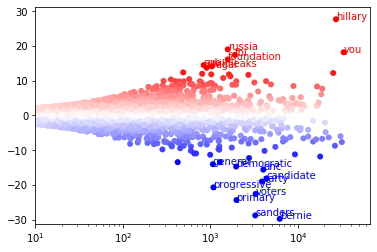

Dec 2016


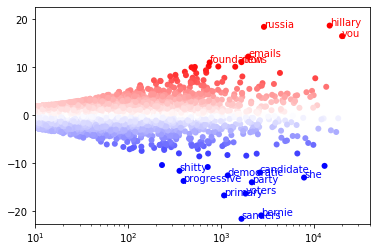

Immigration
Aug 2015


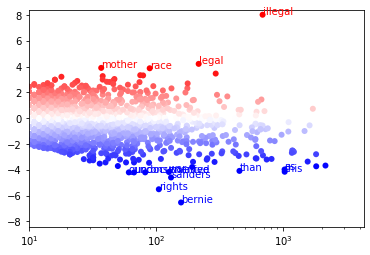

Sep 2015


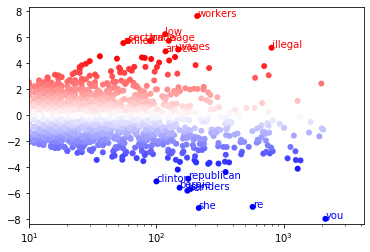

Oct 2015


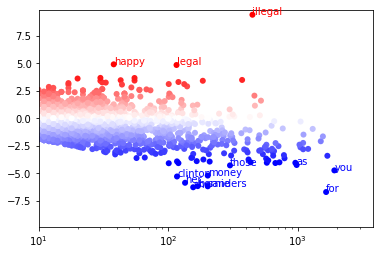

Nov 2015


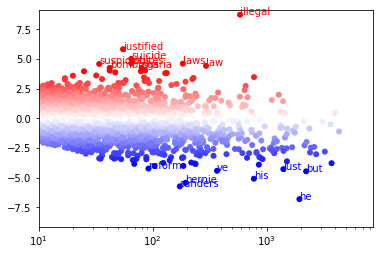

Dec 2015


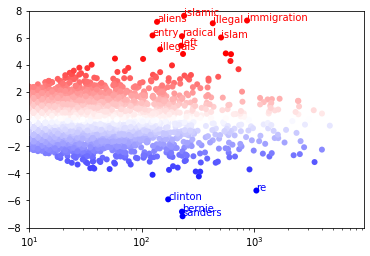

Jan 2016


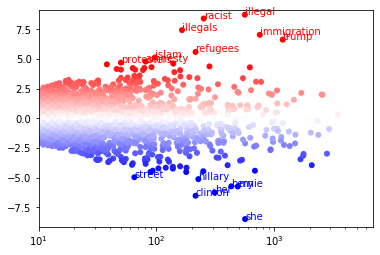

Feb 2016


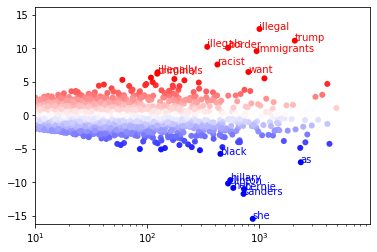

Mar 2016


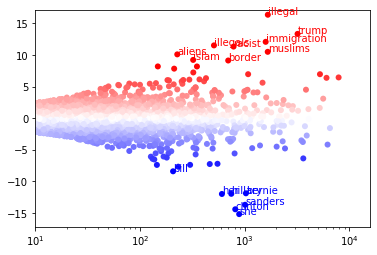

Apr 2016


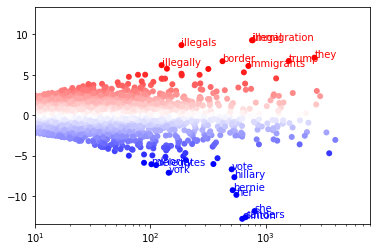

May 2016


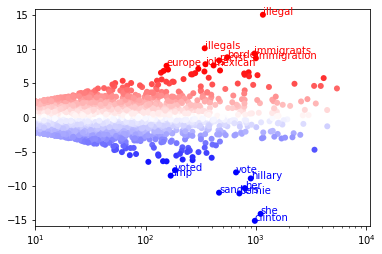

Jun 2016


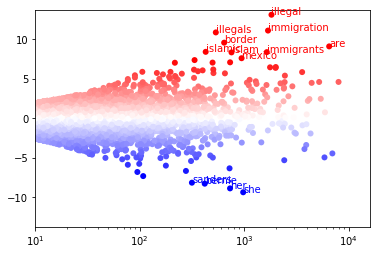

Jul 2016


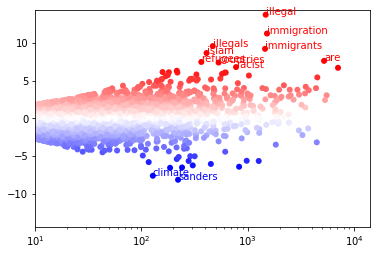

Aug 2016


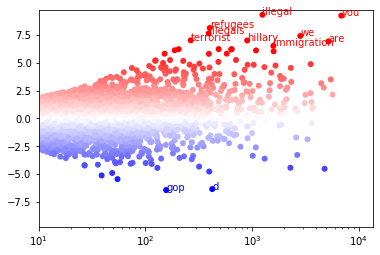

Sep 2016


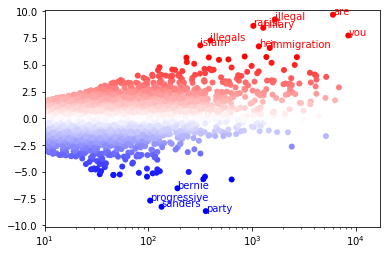

Oct 2016


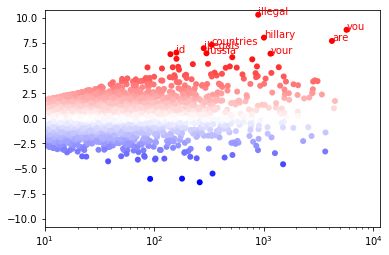

Nov 2016


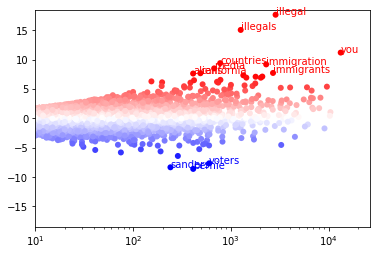

Dec 2016


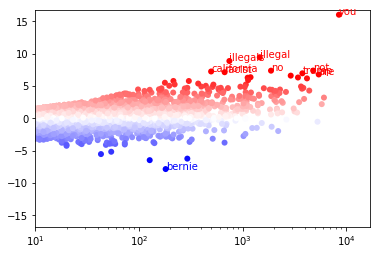

Healthcare
Oct 2015


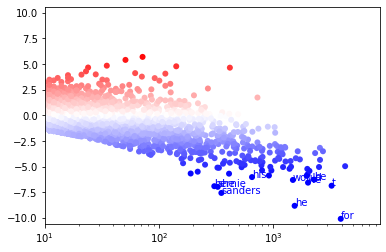

Nov 2015


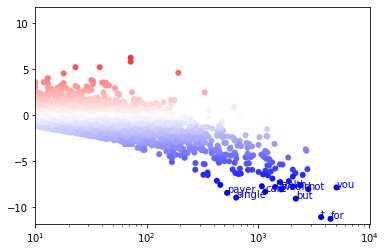

Dec 2015


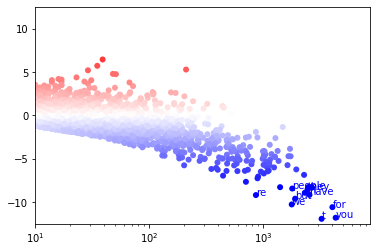

Jan 2016


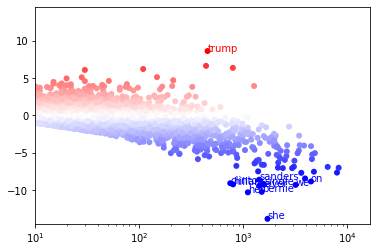

Feb 2016


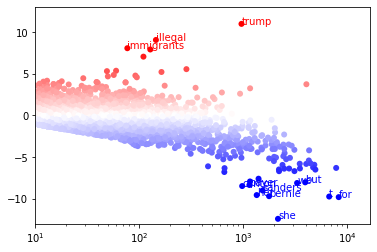

Mar 2016


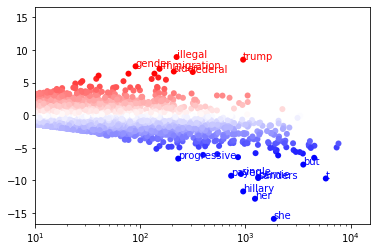

Apr 2016


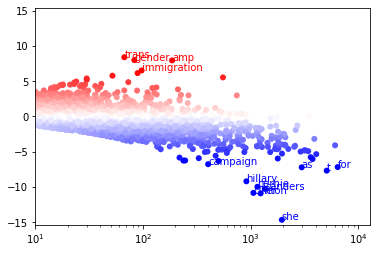

May 2016


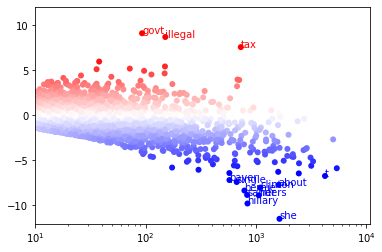

Jun 2016


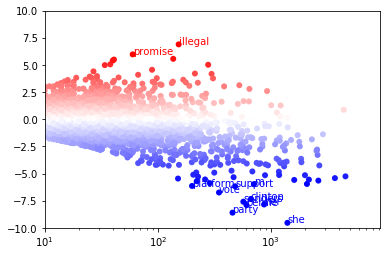

Jul 2016


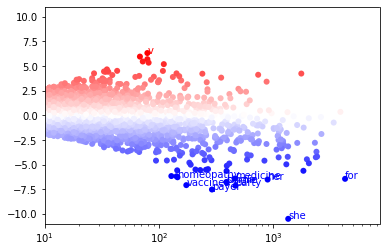

Aug 2016


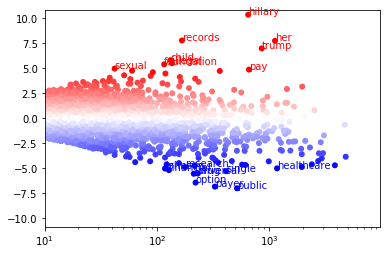

Sep 2016


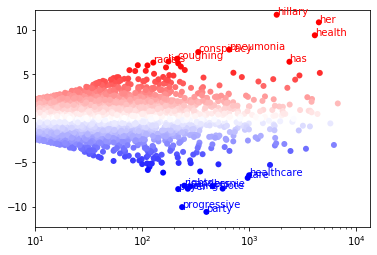

Oct 2016


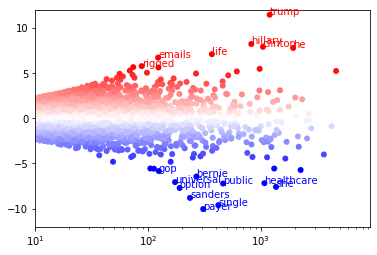

Nov 2016


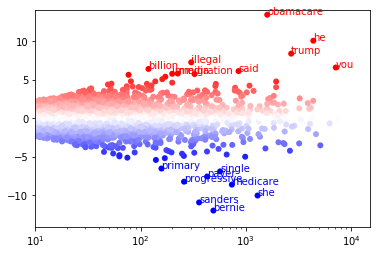

Dec 2016


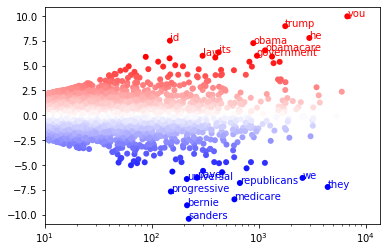

Campaigns
Jan 2015


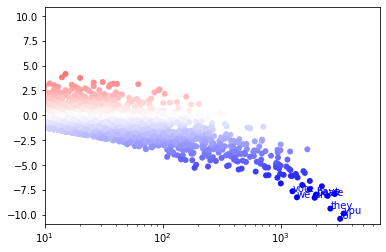

Feb 2015


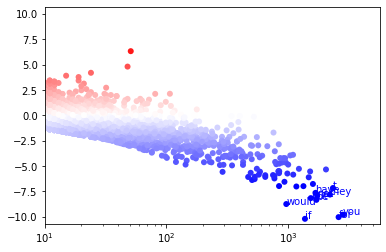

Mar 2015


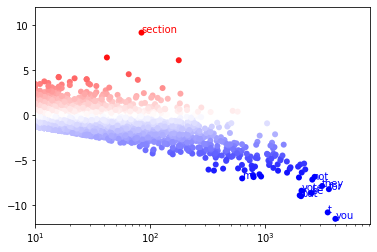

Apr 2015


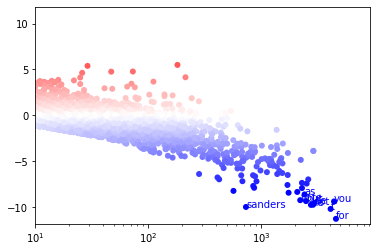

May 2015


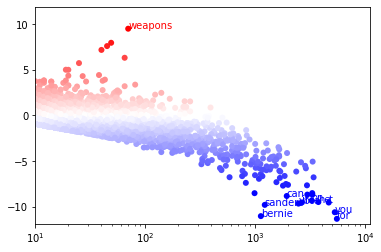

Jun 2015


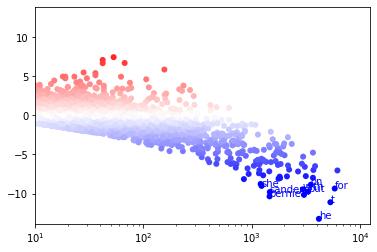

Jul 2015


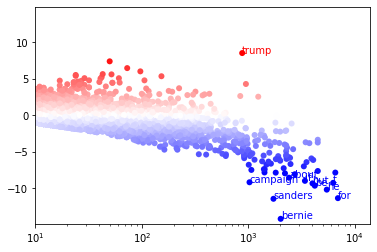

Aug 2015


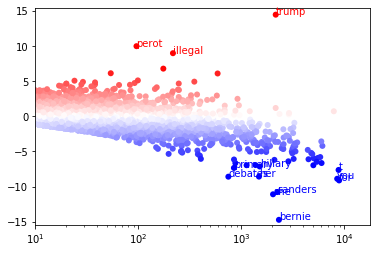

Sep 2015


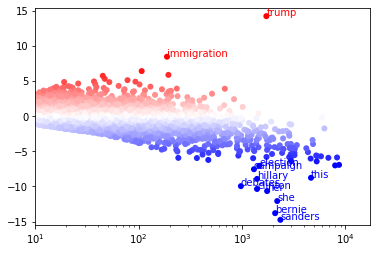

Oct 2015


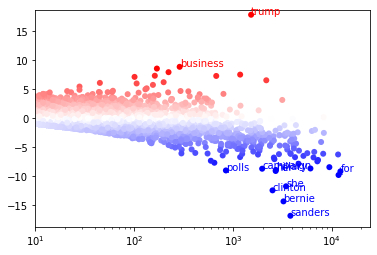

Nov 2015


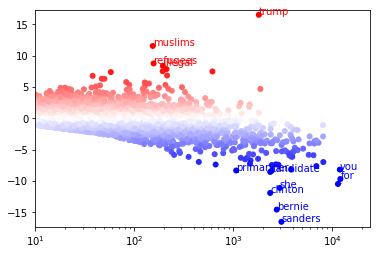

Dec 2015


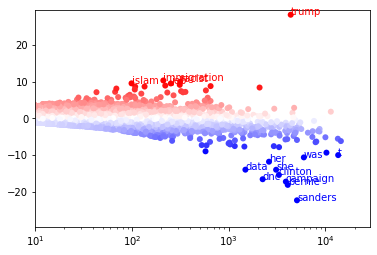

Jan 2016


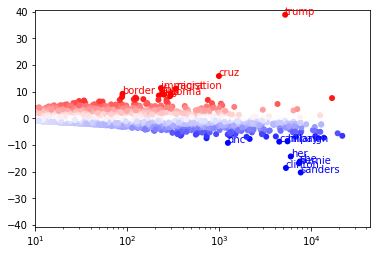

Feb 2016


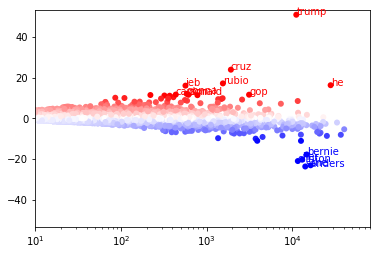

Mar 2016


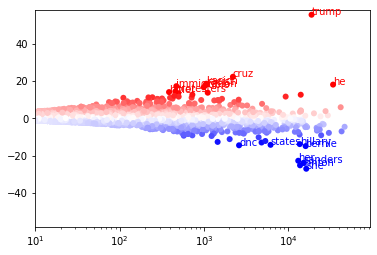

Apr 2016


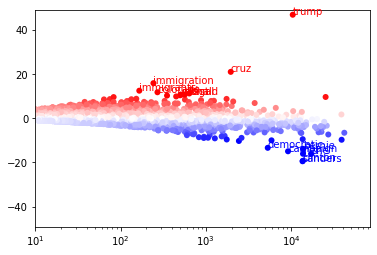

May 2016


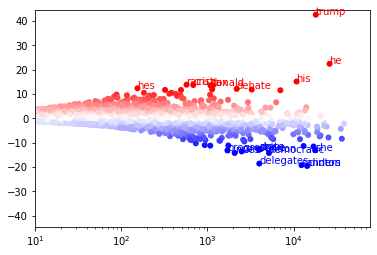

Jun 2016


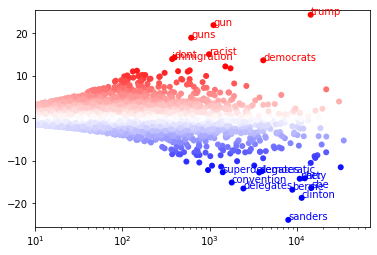

Jul 2016


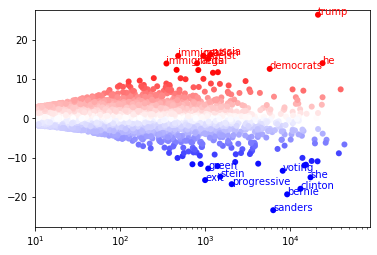

Aug 2016


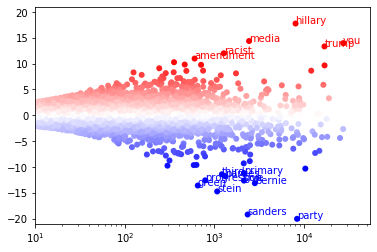

Sep 2016


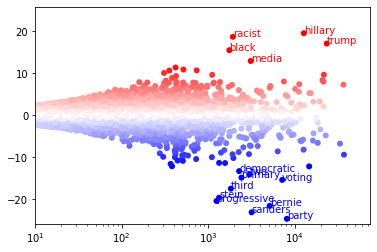

Oct 2016


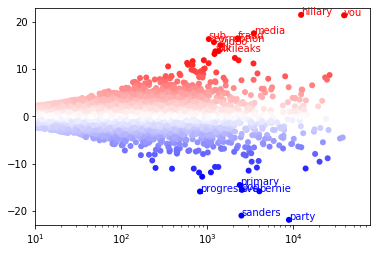

Nov 2016


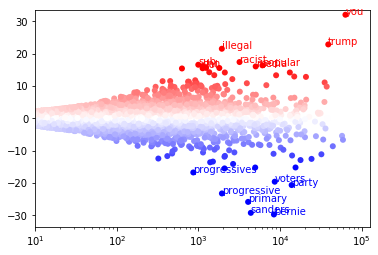

Dec 2016


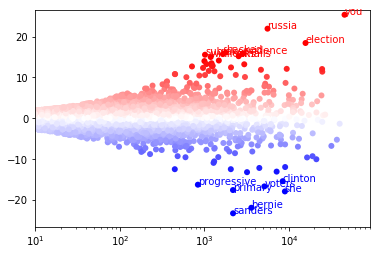

Guns


In [118]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    num_comments_min = 500
    num_comments_observed = [min(sanders_tf_subsets[i][j].shape[0], trump_tf_subsets[i][j].shape[0]) for i in range(24)]
    bad_months = [i for i in range(24) if num_comments_observed[i] < num_comments_min]
    cutoff = 0
    if len(bad_months) > 0:
        cutoff = bad_months[-1] + 1
        
    if cutoff >= 23:
        continue
        
    for i in range(cutoff, 24):
        print(months[i].strftime('%b %Y'))
        tmp_sanders = sanders_tf_subsets[i][j].sum(axis=0).A1
        tmp_trump = trump_tf_subsets[i][j].sum(axis=0).A1

        make_plot(tmp_sanders + tmp_trump, fightin_words_lists[i][j], max(
            sorted(fightin_words_lists[i][j])[-10], -1 * sorted(fightin_words_lists[i][j])[10]))

Trump
Aug 2015


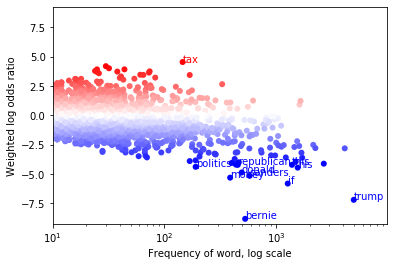

Sep 2015


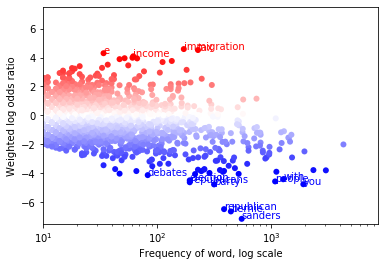

Oct 2015


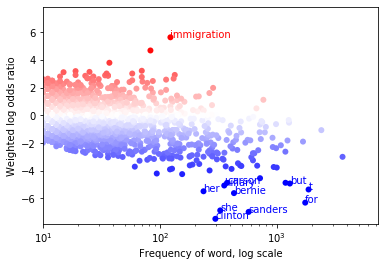

Nov 2015


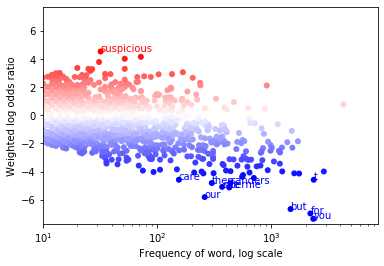

Dec 2015


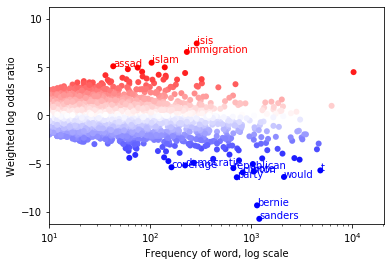

Jan 2016


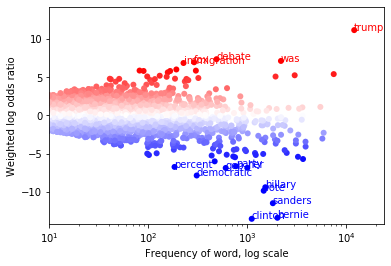

Feb 2016


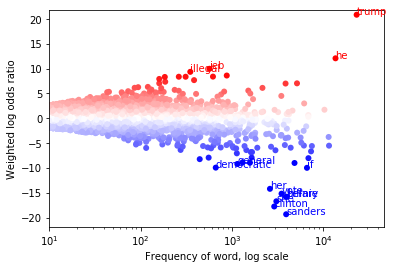

Mar 2016


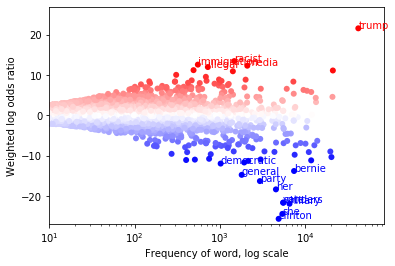

Apr 2016


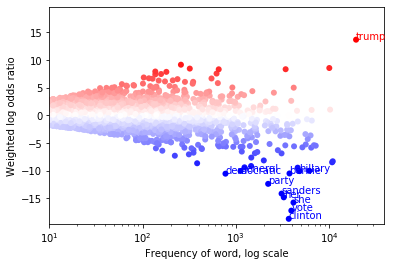

May 2016


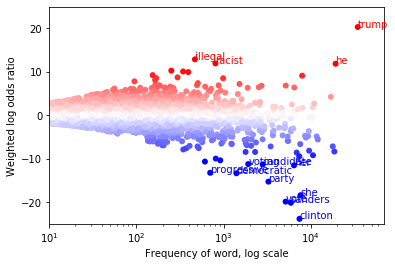

Jun 2016


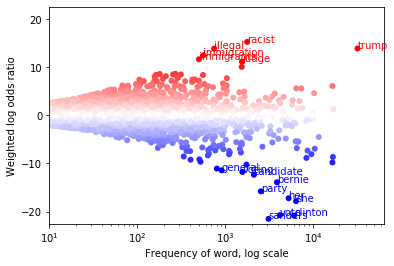

Jul 2016


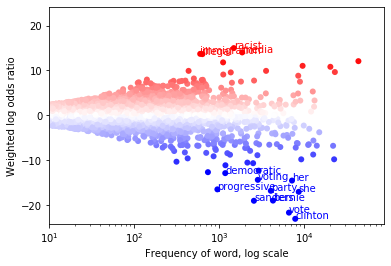

Aug 2016


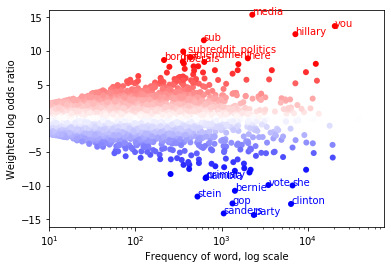

Sep 2016


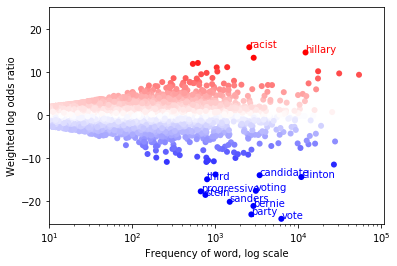

Oct 2016


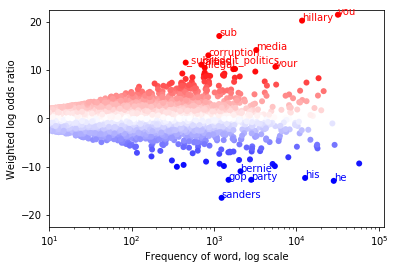

Nov 2016


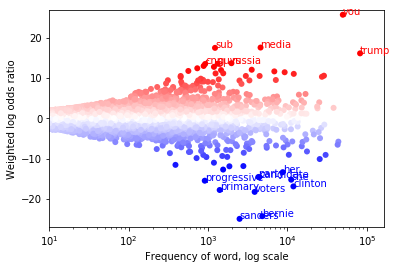

Dec 2016


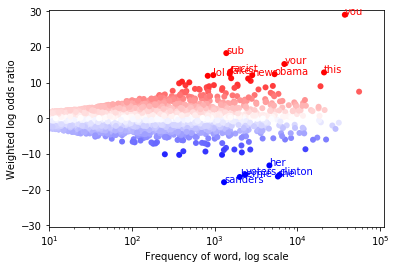

Sanders
Aug 2015


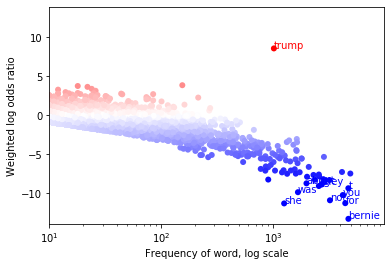

Sep 2015


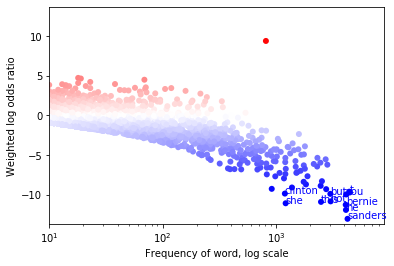

Oct 2015


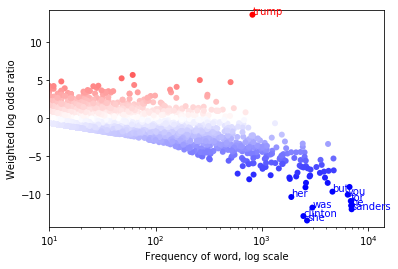

Nov 2015


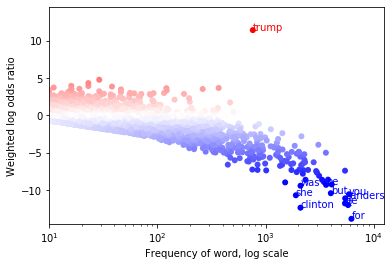

Dec 2015


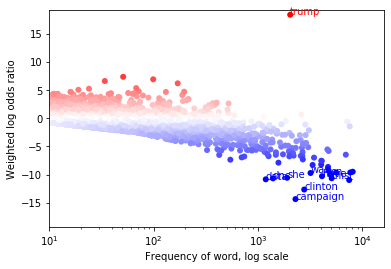

Jan 2016


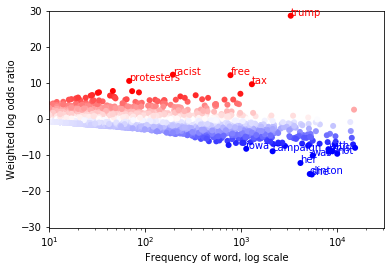

Feb 2016


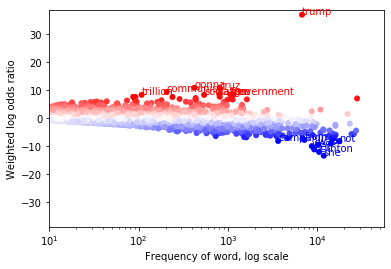

Mar 2016


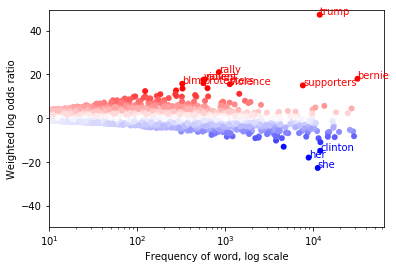

Apr 2016


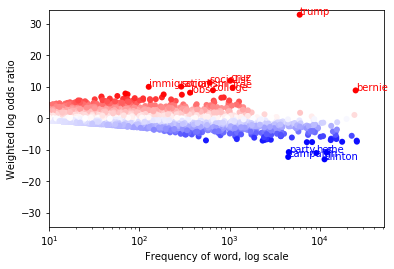

May 2016


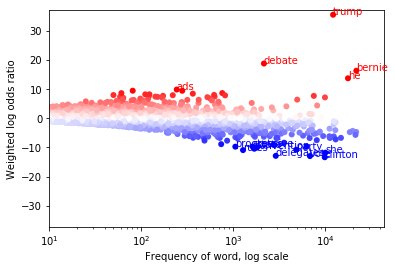

Jun 2016


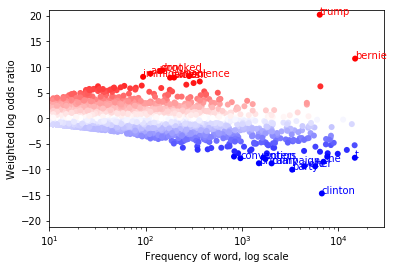

Jul 2016


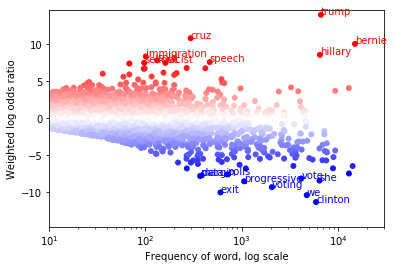

Aug 2016


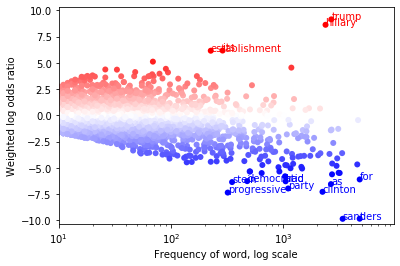

Sep 2016


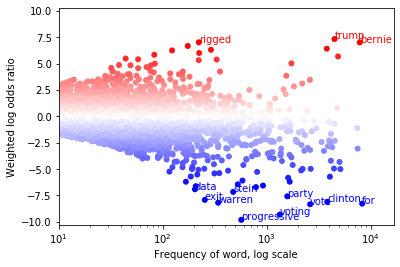

Oct 2016


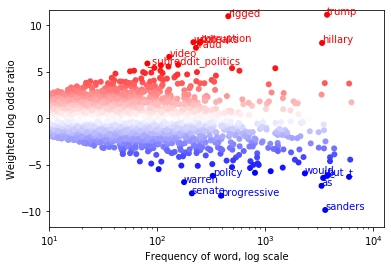

Nov 2016


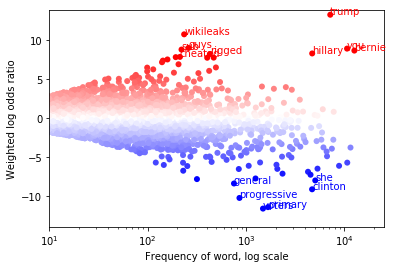

Dec 2016


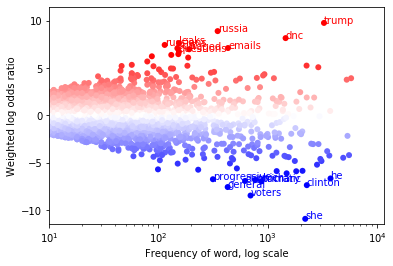

Clinton
Aug 2015


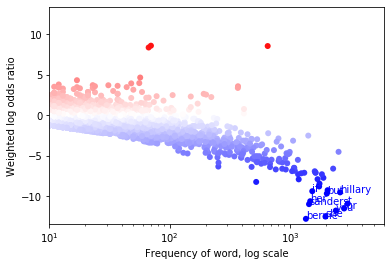

Sep 2015


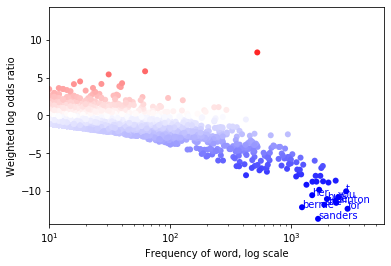

Oct 2015


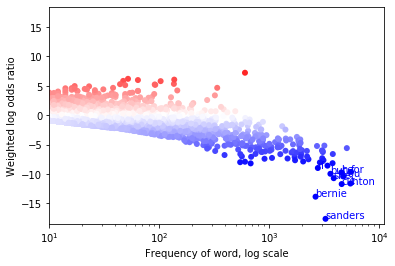

Nov 2015


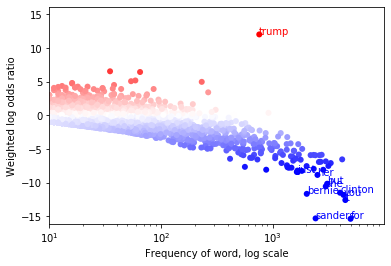

Dec 2015


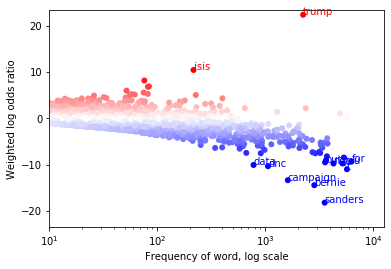

Jan 2016


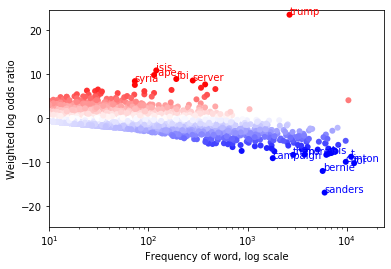

Feb 2016


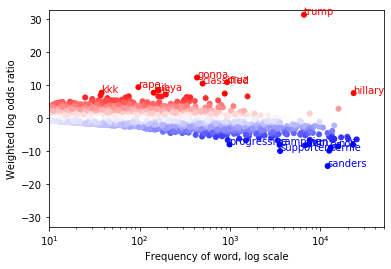

Mar 2016


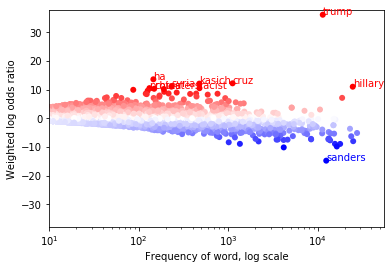

Apr 2016


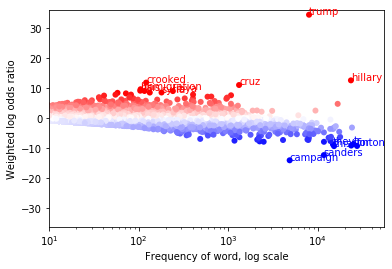

May 2016


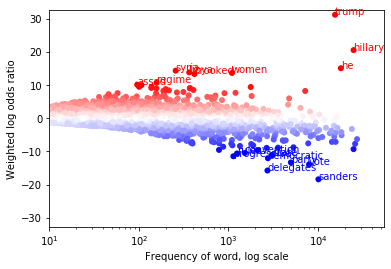

Jun 2016


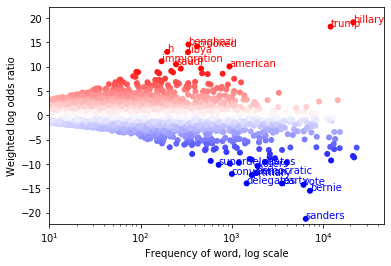

Jul 2016


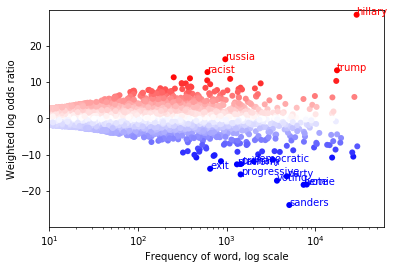

Aug 2016


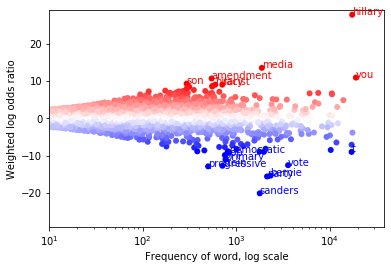

Sep 2016


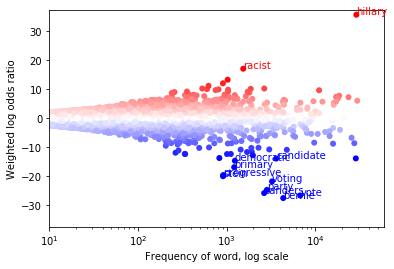

Oct 2016


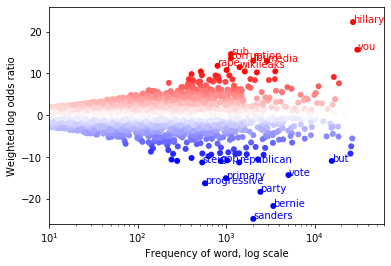

Nov 2016


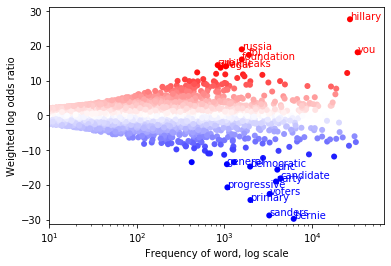

Dec 2016


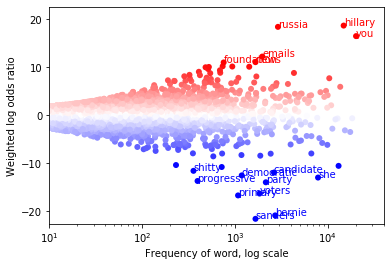

Immigration
Aug 2015


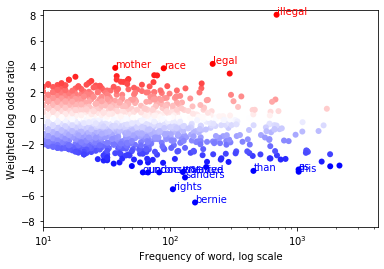

Sep 2015


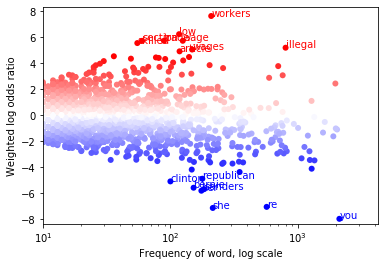

Oct 2015


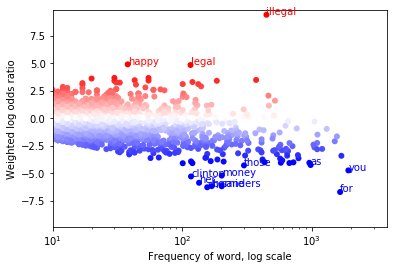

Nov 2015


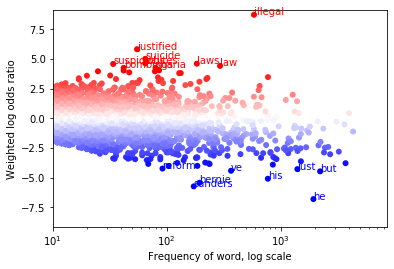

Dec 2015


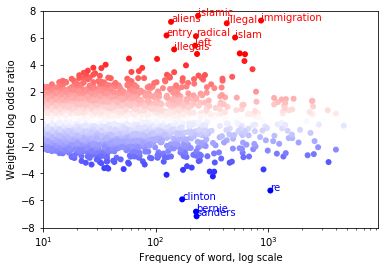

Jan 2016


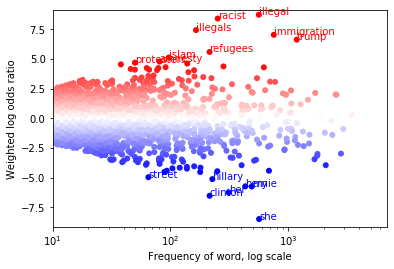

Feb 2016


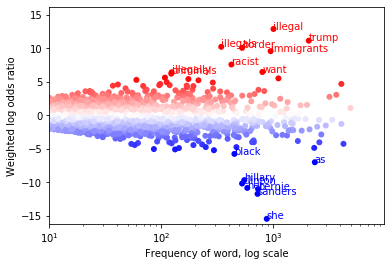

Mar 2016


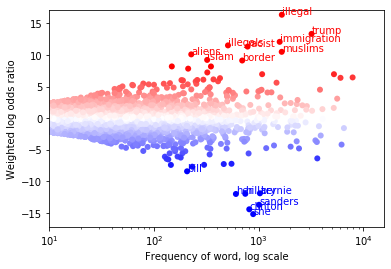

Apr 2016


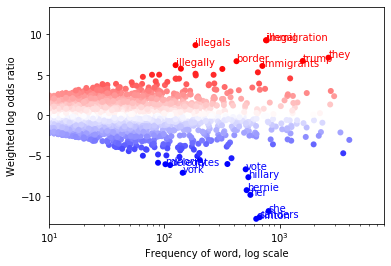

May 2016


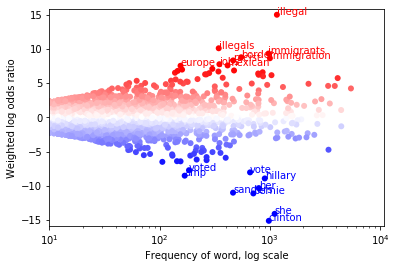

Jun 2016


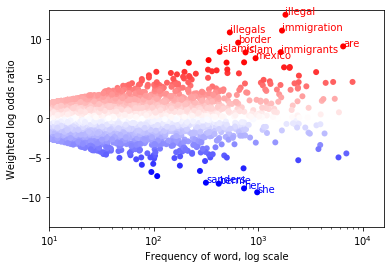

Jul 2016


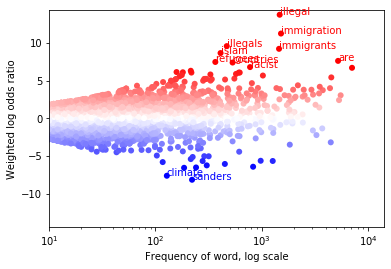

Aug 2016


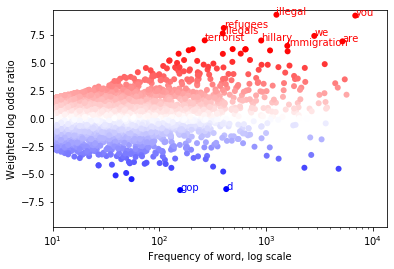

Sep 2016


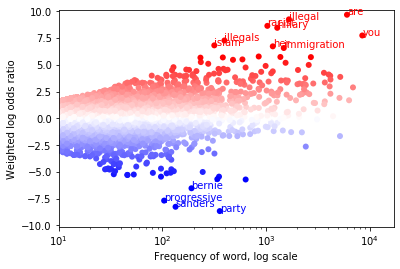

Oct 2016


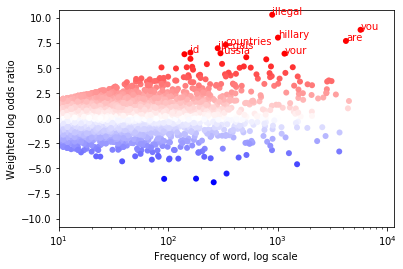

Nov 2016


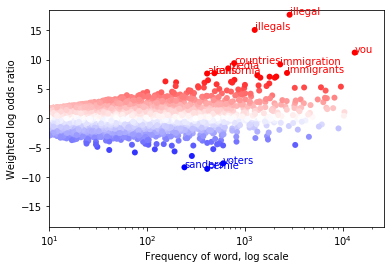

Dec 2016


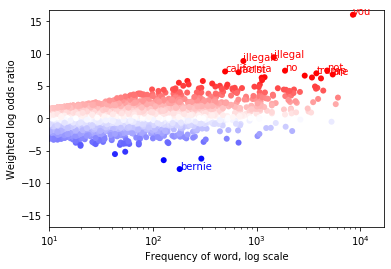

Healthcare
Oct 2015


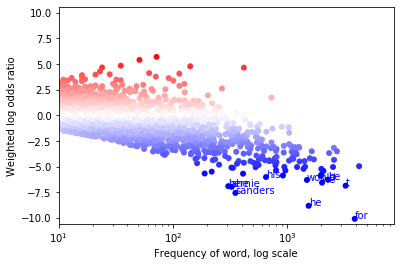

Nov 2015


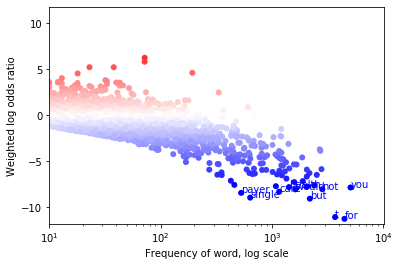

Dec 2015


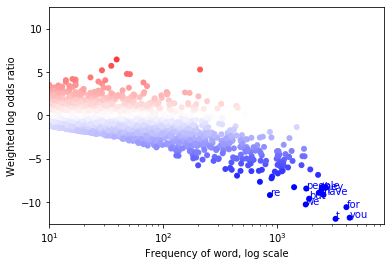

Jan 2016


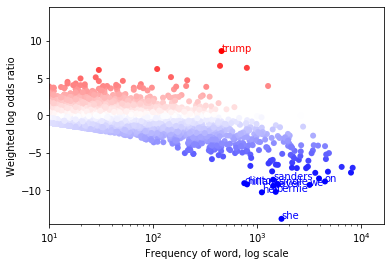

Feb 2016


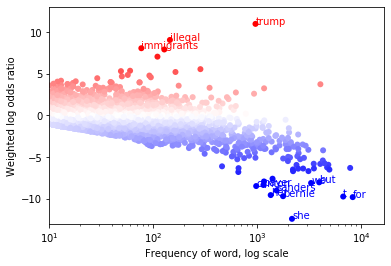

Mar 2016


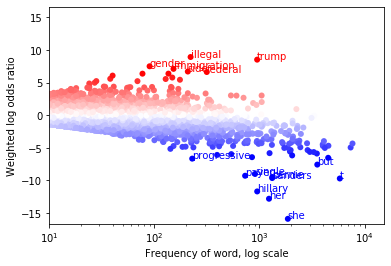

Apr 2016


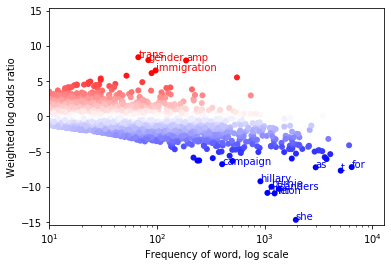

May 2016


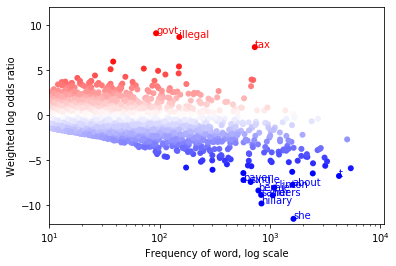

Jun 2016


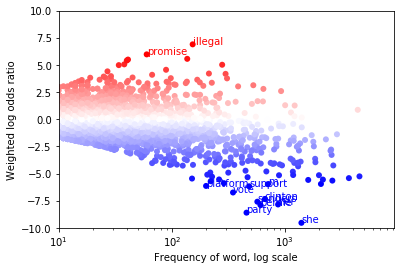

Jul 2016


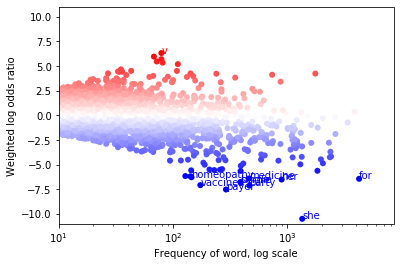

Aug 2016


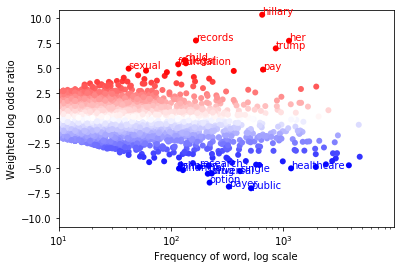

Sep 2016


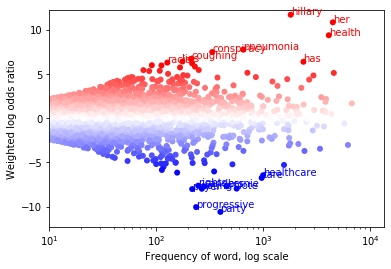

Oct 2016


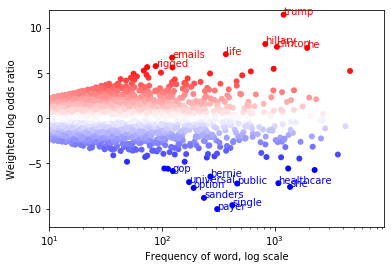

Nov 2016


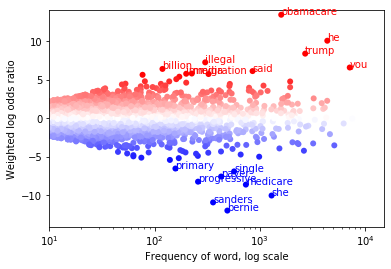

Dec 2016


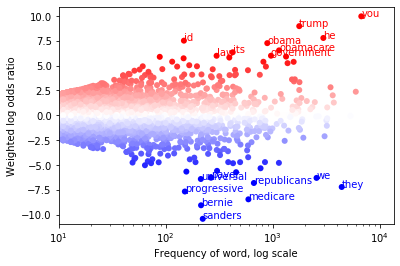

Campaigns
Jan 2015


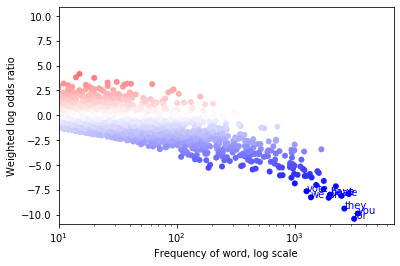

Feb 2015


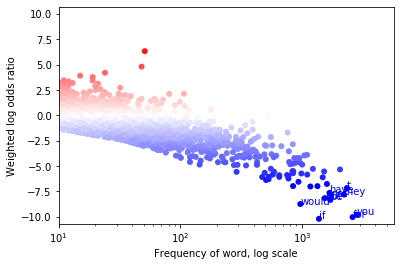

Mar 2015


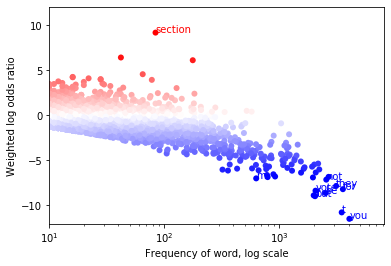

Apr 2015


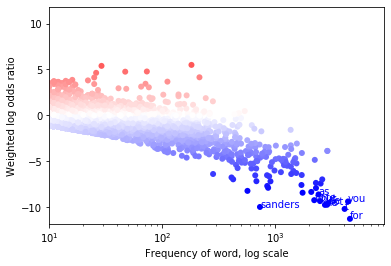

May 2015


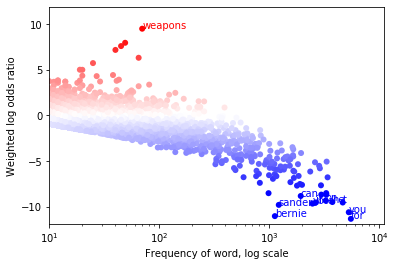

Jun 2015


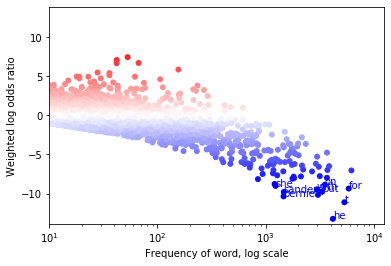

Jul 2015


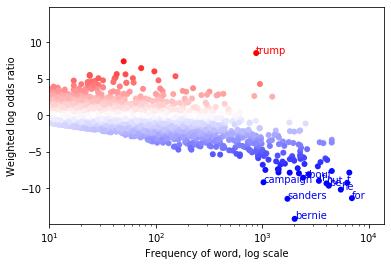

Aug 2015


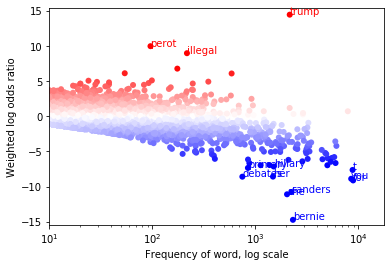

Sep 2015


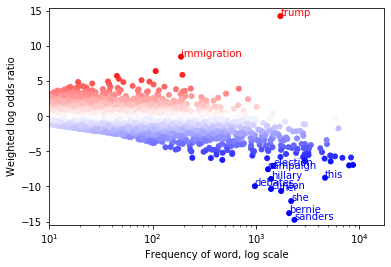

Oct 2015


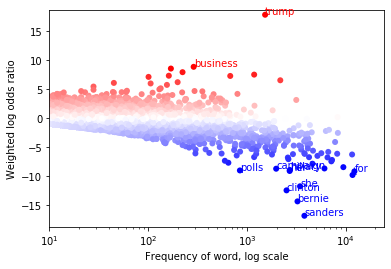

Nov 2015


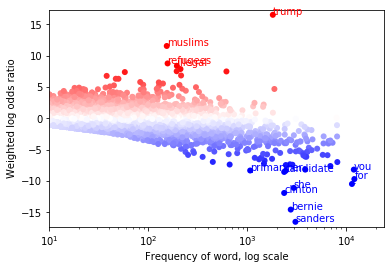

Dec 2015


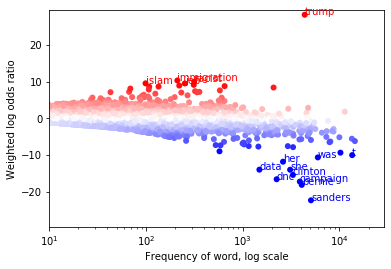

Jan 2016


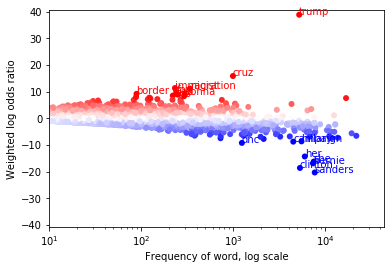

Feb 2016


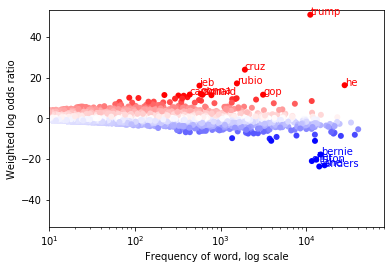

Mar 2016


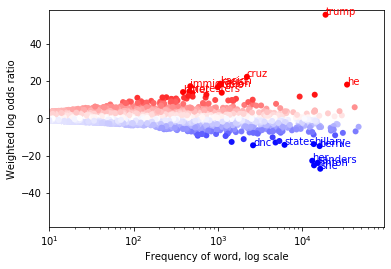

Apr 2016


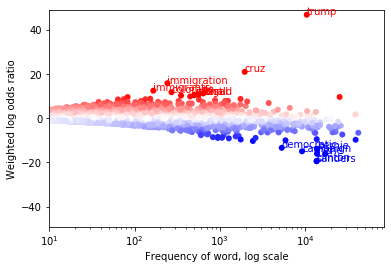

May 2016


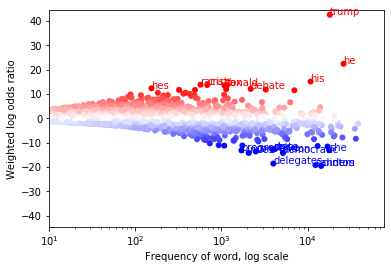

Jun 2016


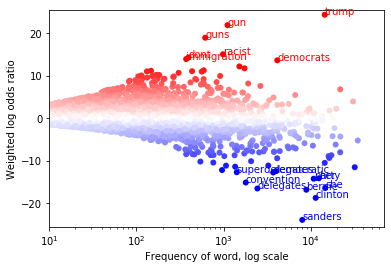

Jul 2016


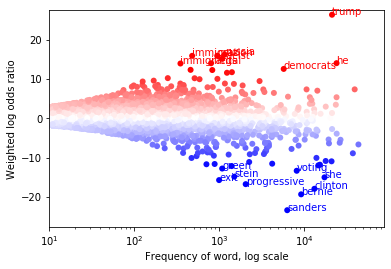

Aug 2016


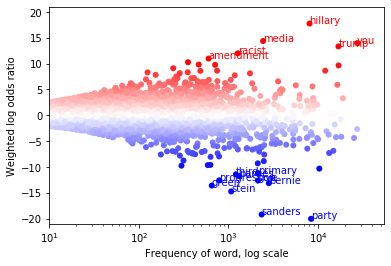

Sep 2016


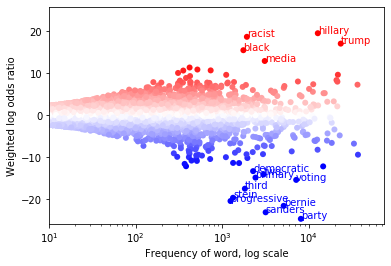

Oct 2016


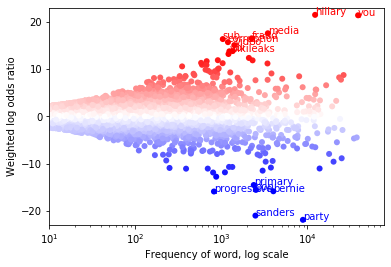

Nov 2016


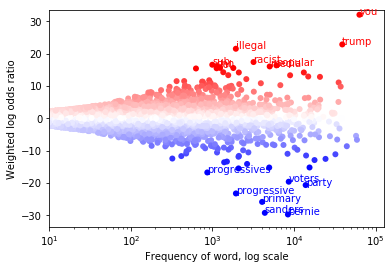

Dec 2016


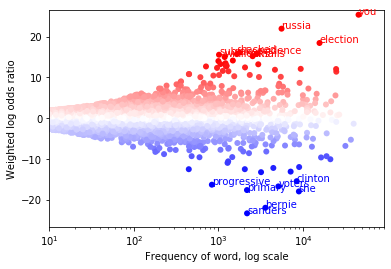

Guns


In [126]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    num_comments_min = 500
    num_comments_observed = [min(sanders_tf_subsets[i][j].shape[0], trump_tf_subsets[i][j].shape[0]) for i in range(24)]
    bad_months = [i for i in range(24) if num_comments_observed[i] < num_comments_min]
    cutoff = 0
    if len(bad_months) > 0:
        cutoff = bad_months[-1] + 1
        
    if cutoff >= 23:
        continue
        
    for i in range(cutoff, 24):
        print(months[i].strftime('%b %Y'))
        tmp_sanders = sanders_tf_subsets[i][j].sum(axis=0).A1
        tmp_trump = trump_tf_subsets[i][j].sum(axis=0).A1

        make_plot(tmp_sanders + tmp_trump, fightin_words_lists[i][j], max(
            sorted(fightin_words_lists[i][j])[-10], -1 * sorted(fightin_words_lists[i][j])[10]), 
                  'Weighted log odds ratio')

Trump
Aug 2015


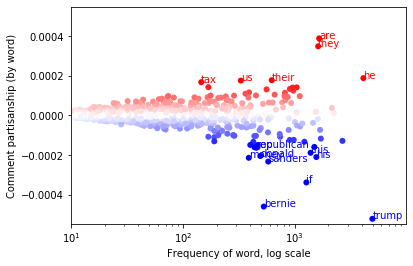

Sep 2015


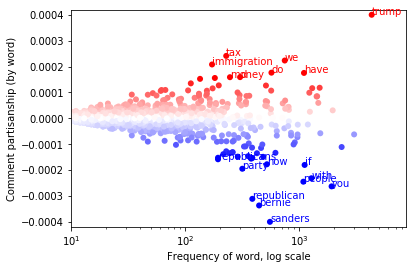

Oct 2015


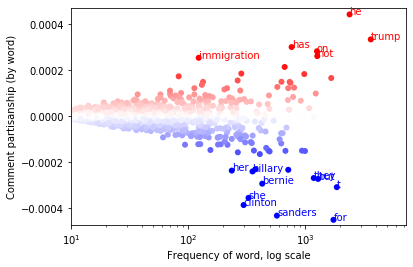

Nov 2015


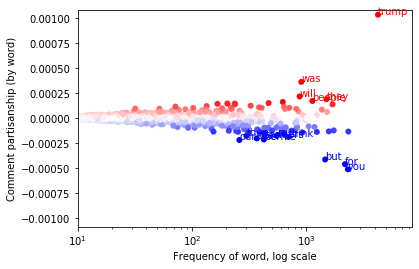

Dec 2015


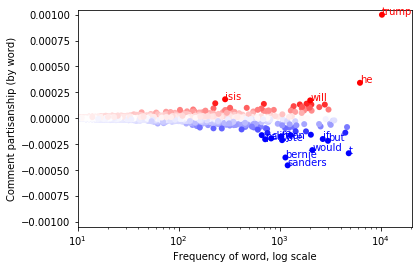

Jan 2016


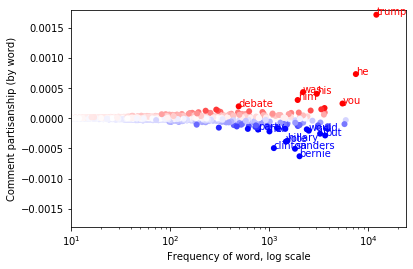

Feb 2016


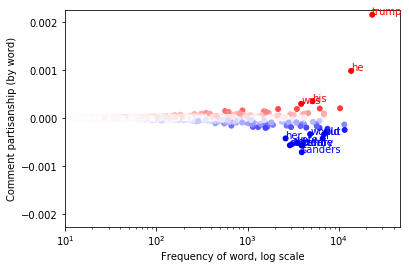

Mar 2016


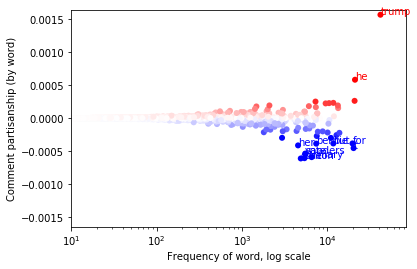

Apr 2016


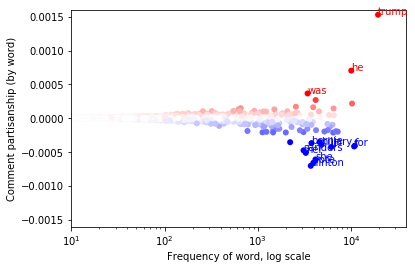

May 2016


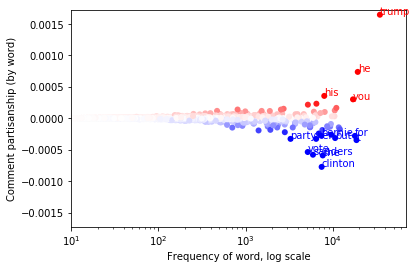

Jun 2016


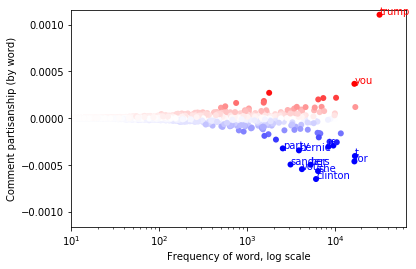

Jul 2016


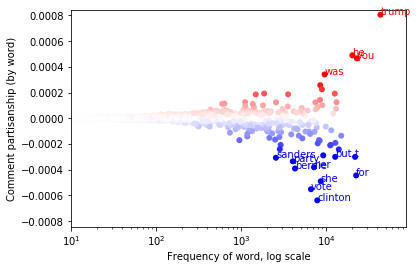

Aug 2016


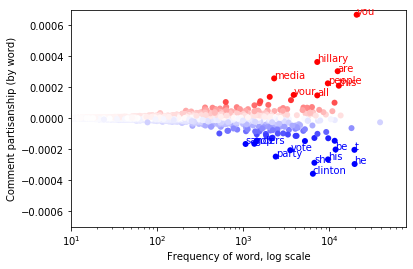

Sep 2016


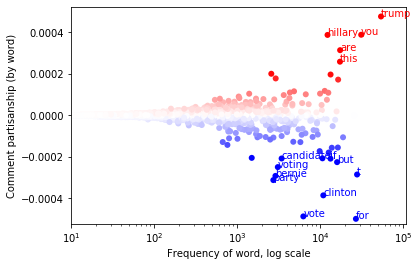

Oct 2016


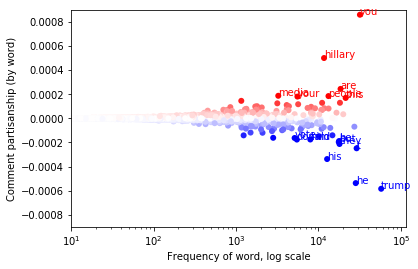

Nov 2016


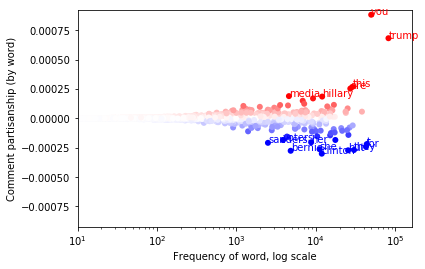

Dec 2016


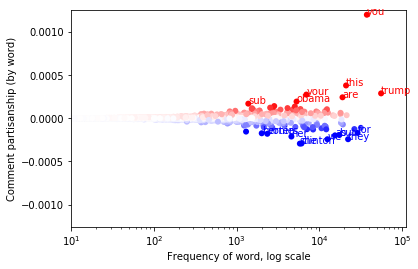

Sanders
Aug 2015


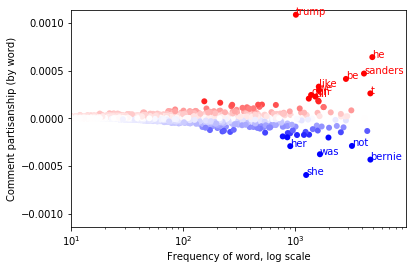

Sep 2015


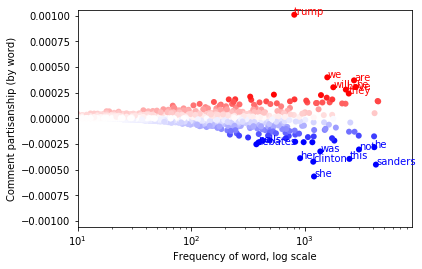

Oct 2015


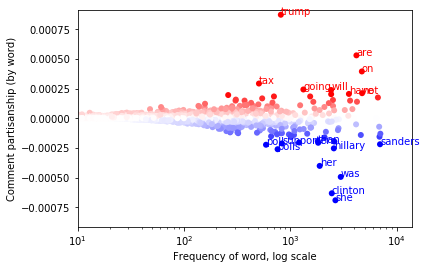

Nov 2015


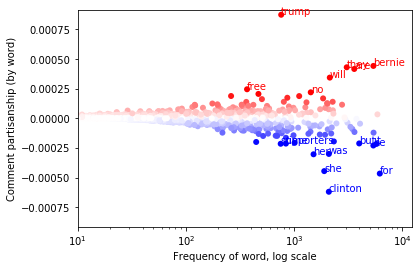

Dec 2015


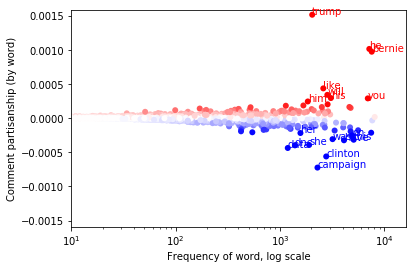

Jan 2016


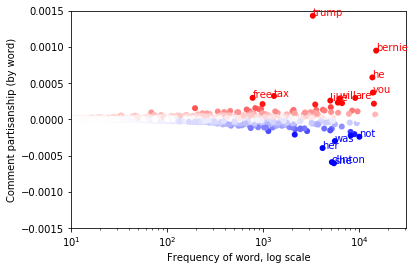

Feb 2016


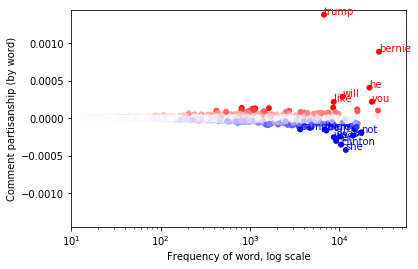

Mar 2016


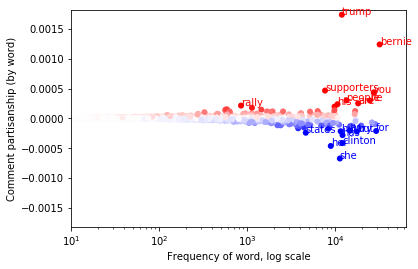

Apr 2016


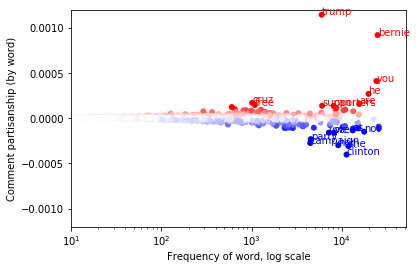

May 2016


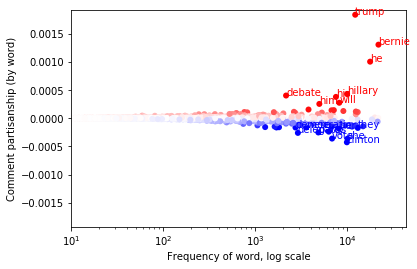

Jun 2016


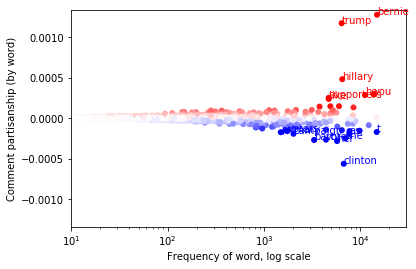

Jul 2016


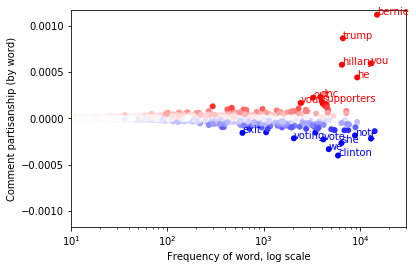

Aug 2016


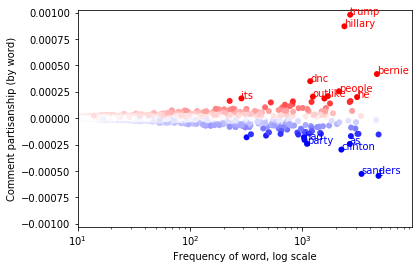

Sep 2016


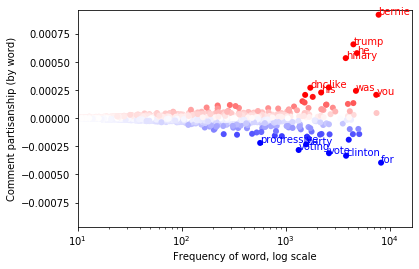

Oct 2016


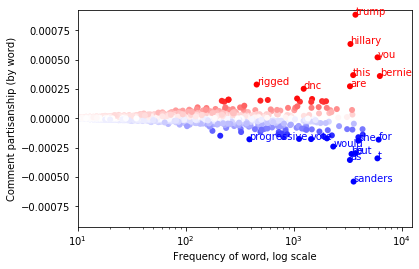

Nov 2016


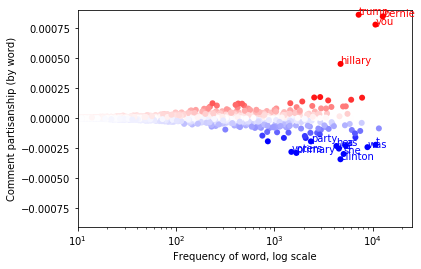

Dec 2016


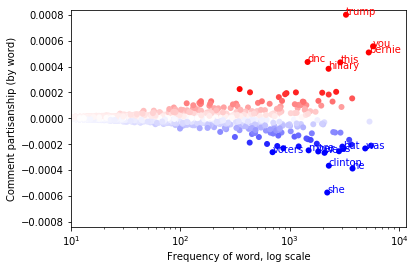

Clinton
Aug 2015


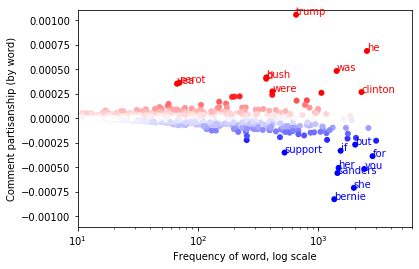

Sep 2015


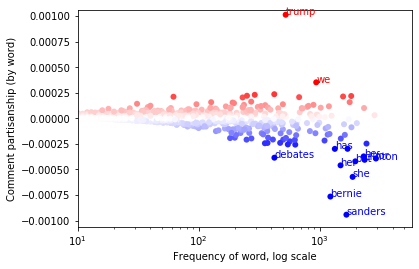

Oct 2015


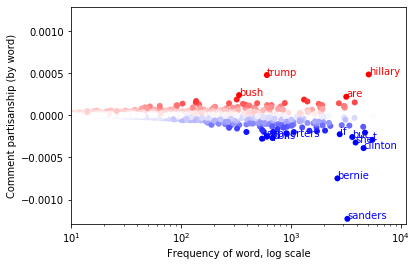

Nov 2015


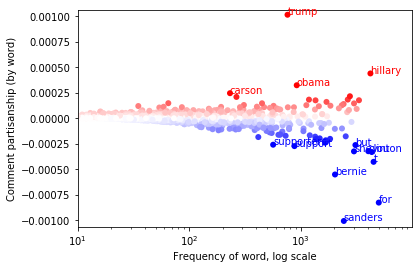

Dec 2015


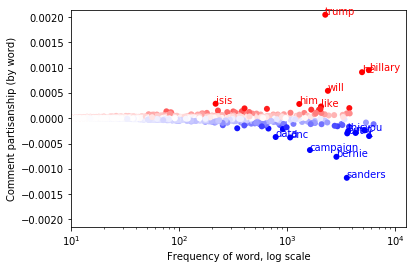

Jan 2016


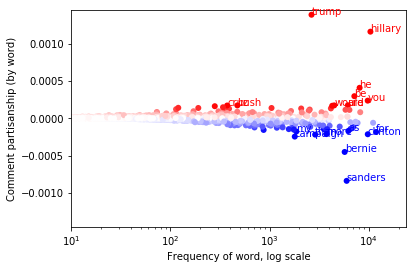

Feb 2016


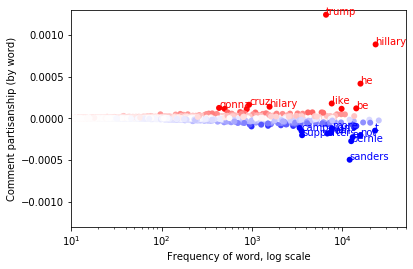

Mar 2016


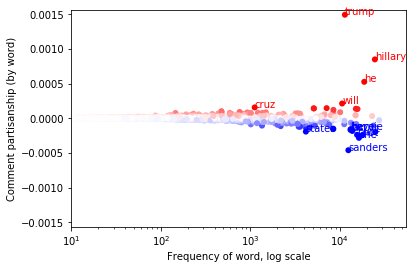

Apr 2016


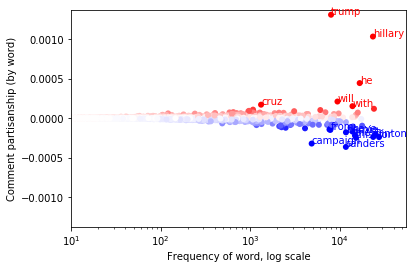

May 2016


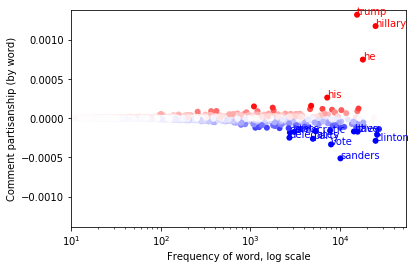

Jun 2016


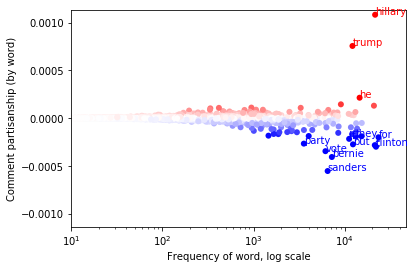

Jul 2016


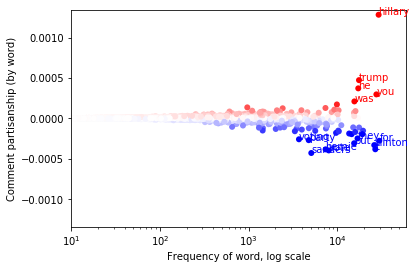

Aug 2016


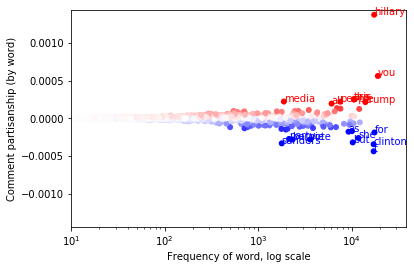

Sep 2016


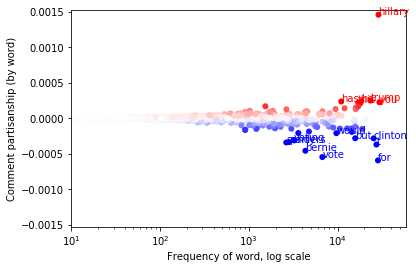

Oct 2016


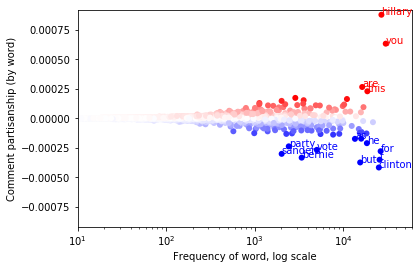

Nov 2016


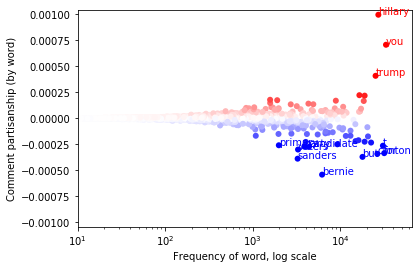

Dec 2016


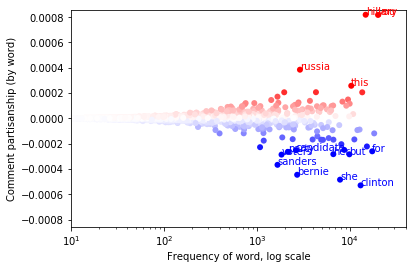

Immigration
Aug 2015


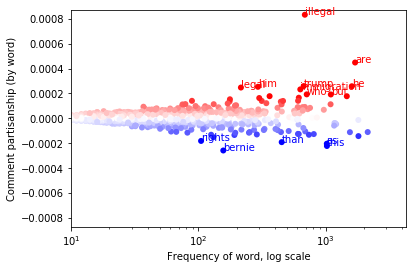

Sep 2015


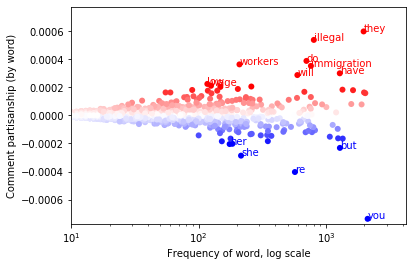

Oct 2015


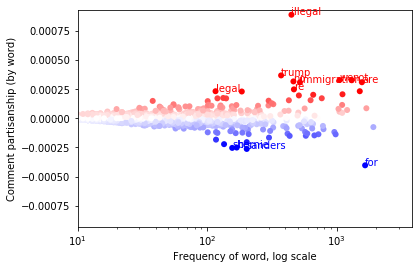

Nov 2015


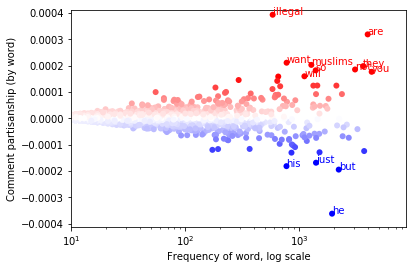

Dec 2015


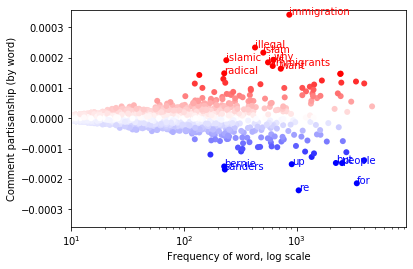

Jan 2016


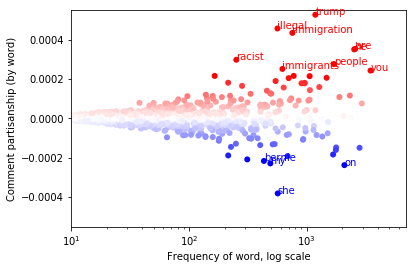

Feb 2016


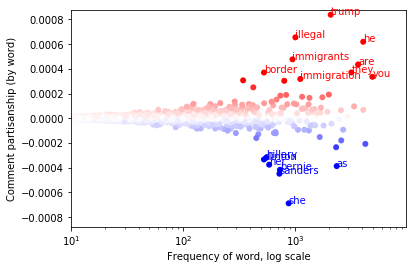

Mar 2016


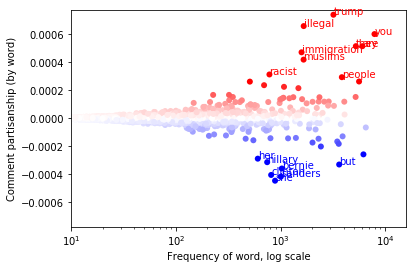

Apr 2016


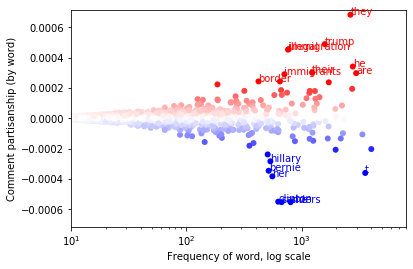

May 2016


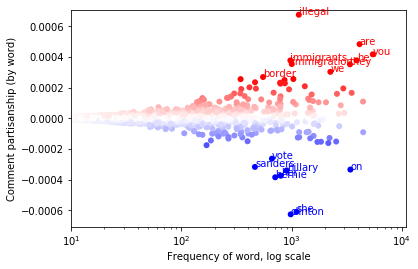

Jun 2016


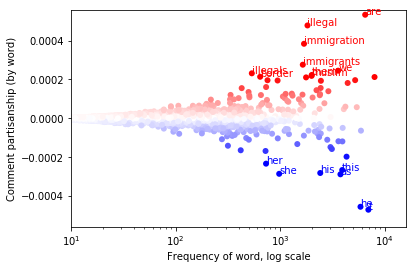

Jul 2016


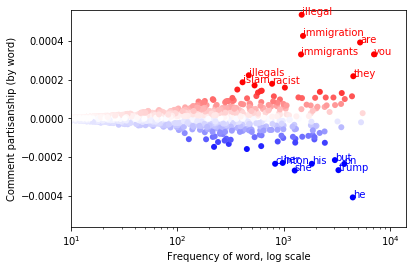

Aug 2016


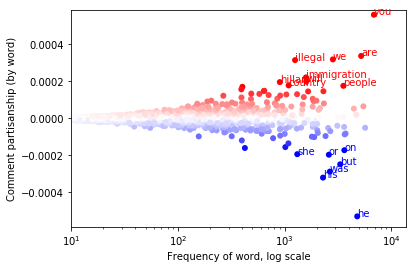

Sep 2016


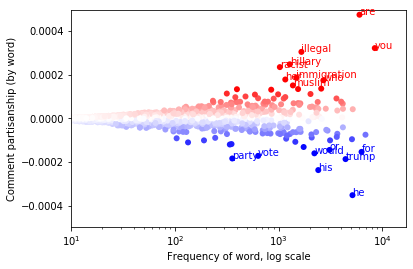

Oct 2016


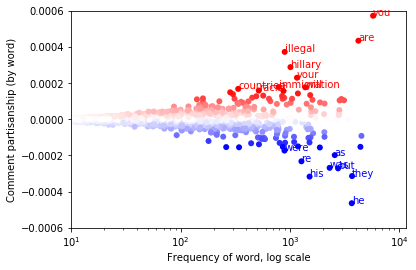

Nov 2016


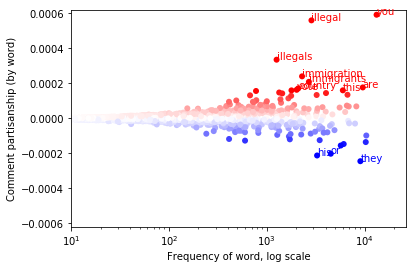

Dec 2016


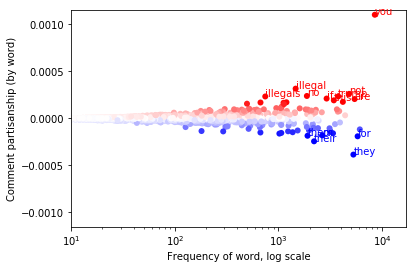

Healthcare
Oct 2015


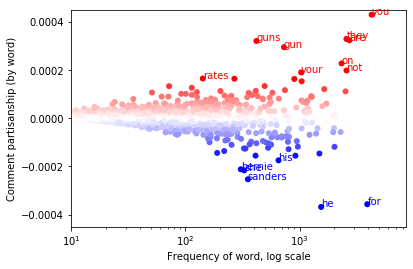

Nov 2015


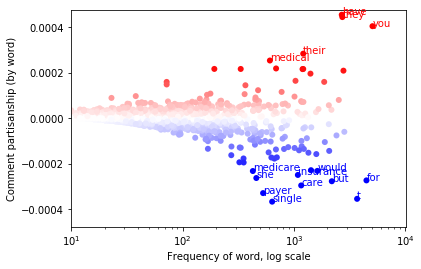

Dec 2015


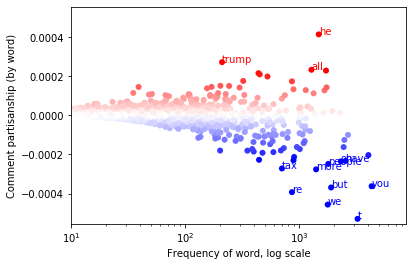

Jan 2016


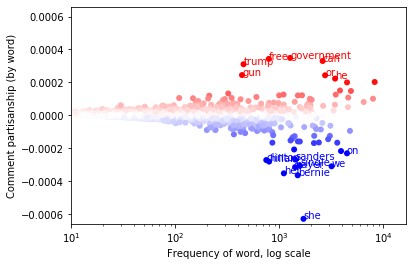

Feb 2016


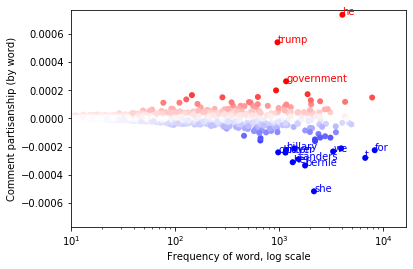

Mar 2016


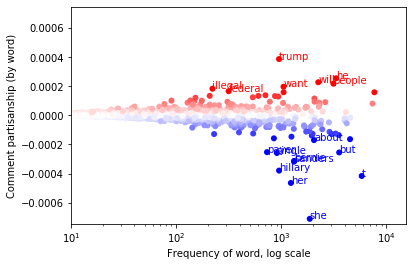

Apr 2016


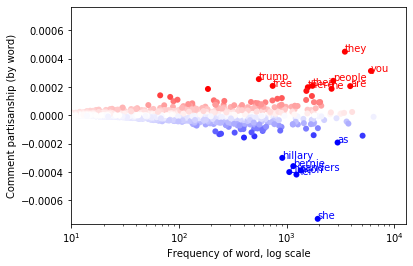

May 2016


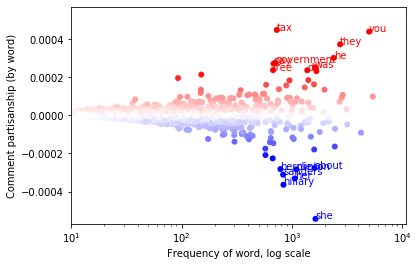

Jun 2016


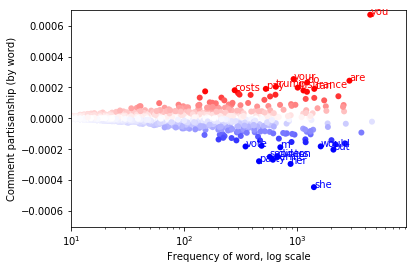

Jul 2016


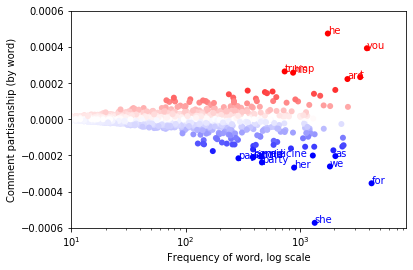

Aug 2016


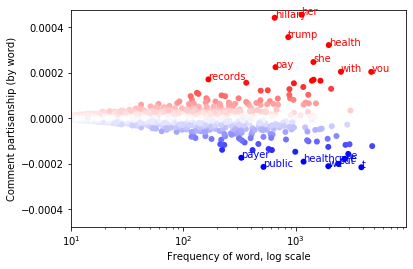

Sep 2016


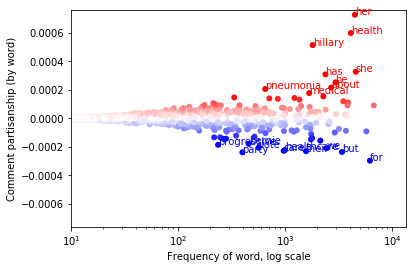

Oct 2016


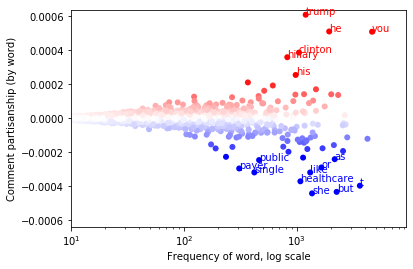

Nov 2016


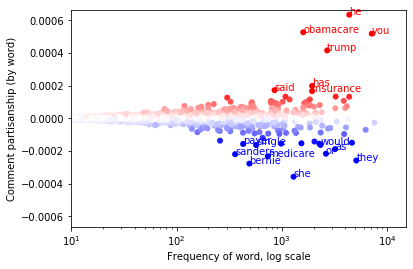

Dec 2016


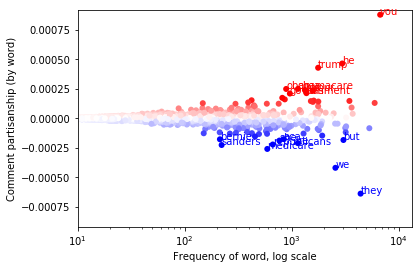

Campaigns
Jan 2015


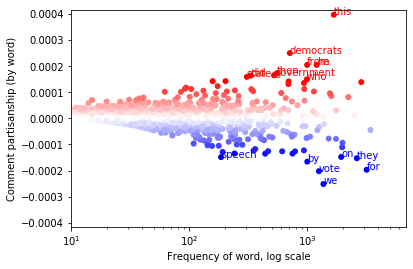

Feb 2015


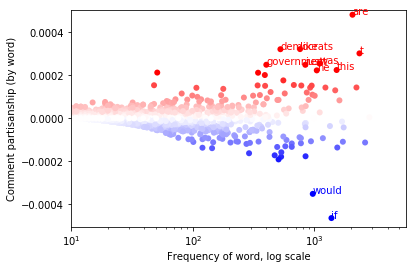

Mar 2015


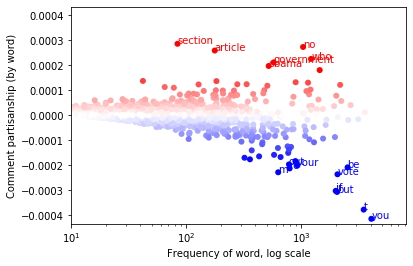

Apr 2015


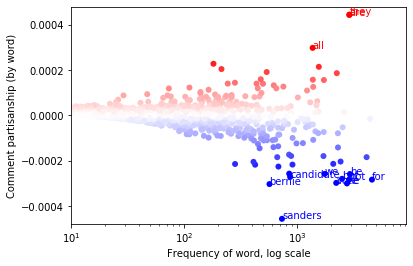

May 2015


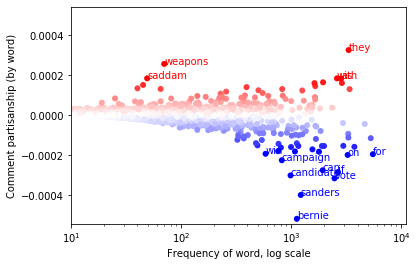

Jun 2015


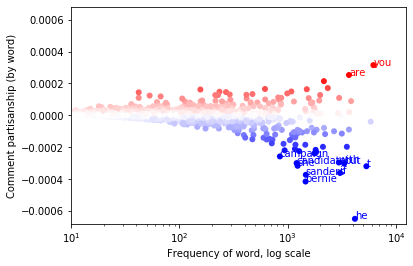

Jul 2015


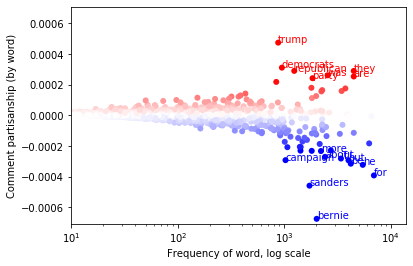

Aug 2015


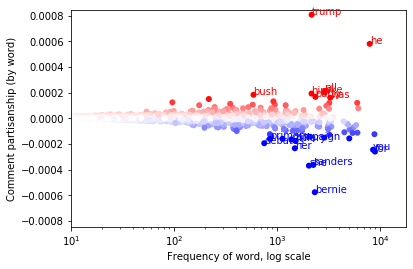

Sep 2015


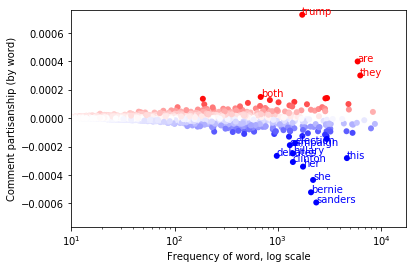

Oct 2015


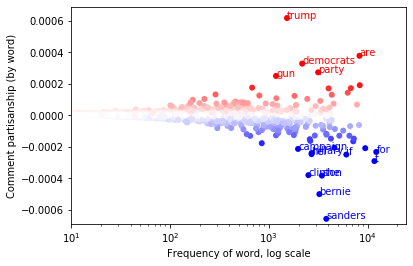

Nov 2015


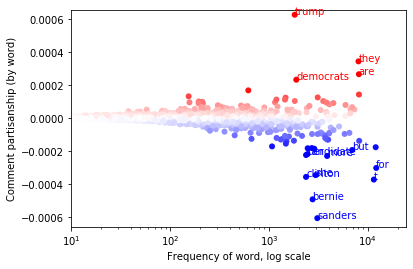

Dec 2015


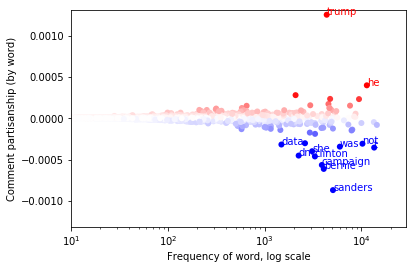

Jan 2016


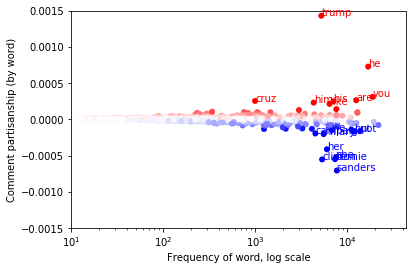

Feb 2016


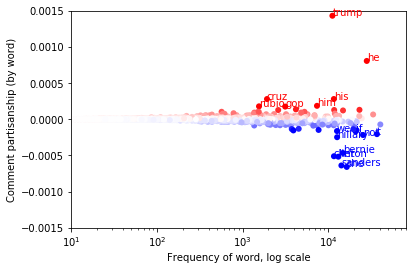

Mar 2016


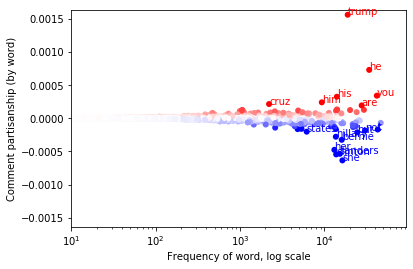

Apr 2016


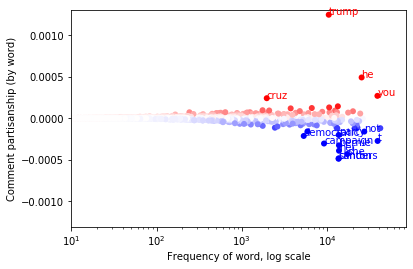

May 2016


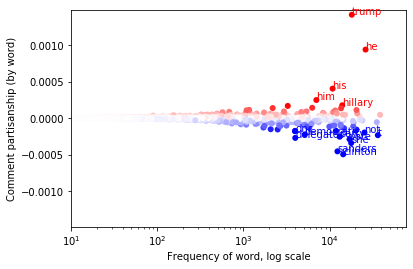

Jun 2016


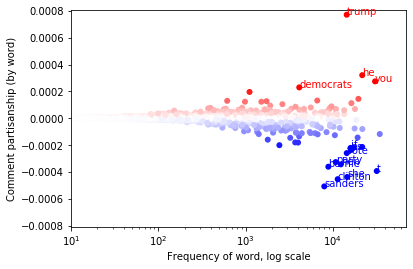

Jul 2016


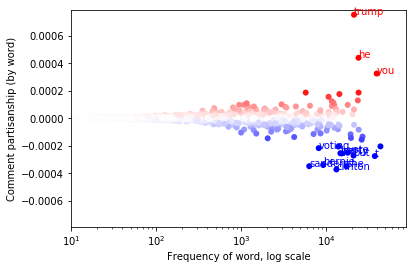

Aug 2016


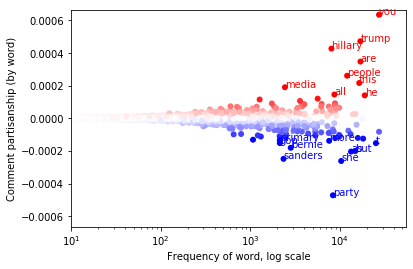

Sep 2016


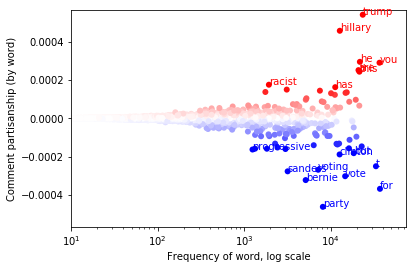

Oct 2016


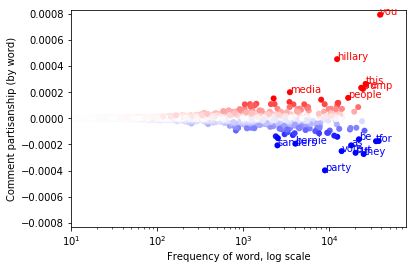

Nov 2016


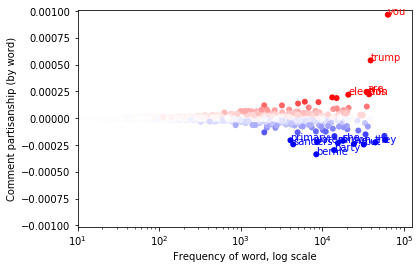

Dec 2016


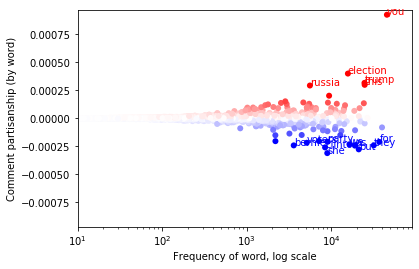

Guns


In [127]:
for j in range(len(word_sets)):
    print(word_set_names[j])
    
    num_comments_min = 500
    num_comments_observed = [min(sanders_tf_subsets[i][j].shape[0], trump_tf_subsets[i][j].shape[0]) for i in range(24)]
    bad_months = [i for i in range(24) if num_comments_observed[i] < num_comments_min]
    cutoff = 0
    if len(bad_months) > 0:
        cutoff = bad_months[-1] + 1
        
    if cutoff >= 23:
        continue
        
    for i in range(cutoff,24):
        print(months[i].strftime('%b %Y'))
        tmp_sanders = sanders_tf_subsets[i][j].sum(axis=0).A1
        tmp_trump = trump_tf_subsets[i][j].sum(axis=0).A1

        make_plot(tmp_sanders + tmp_trump, polarization_by_month[i][j], max(
            sorted(polarization_by_month[i][j])[-10], -1 * sorted(polarization_by_month[i][j])[10]),
                 'Comment partisanship (by word)')

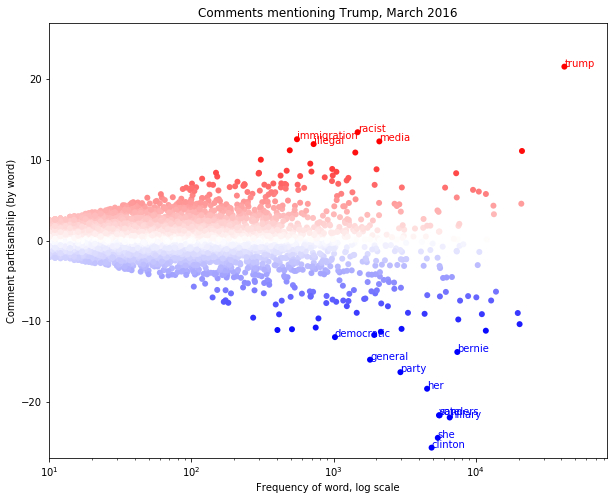

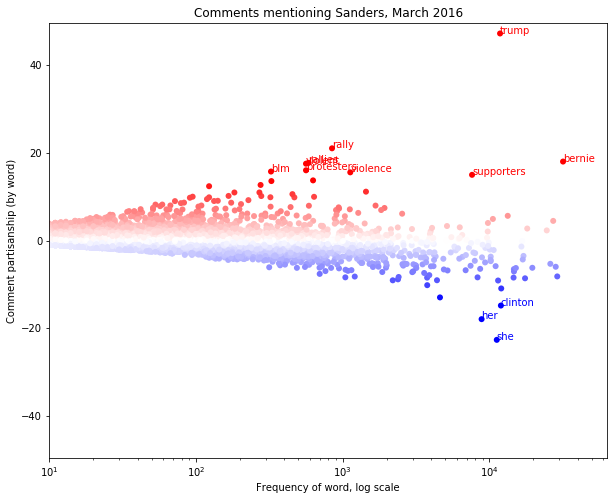

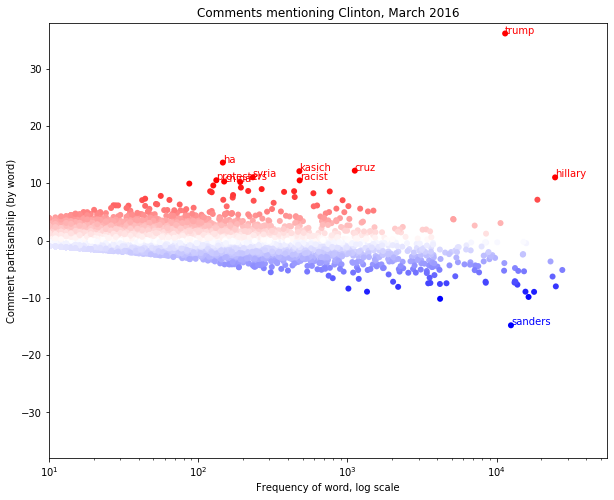

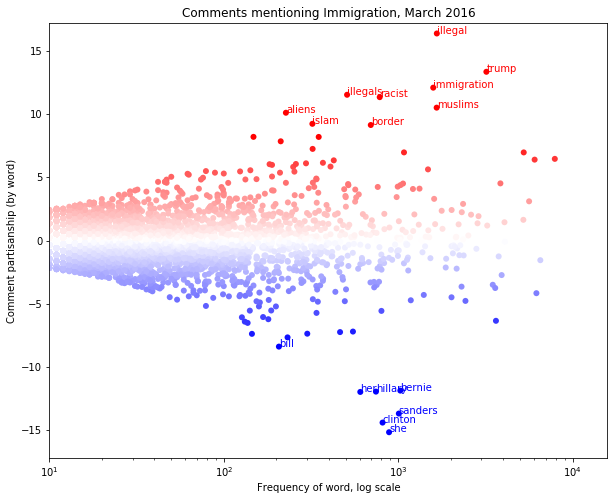

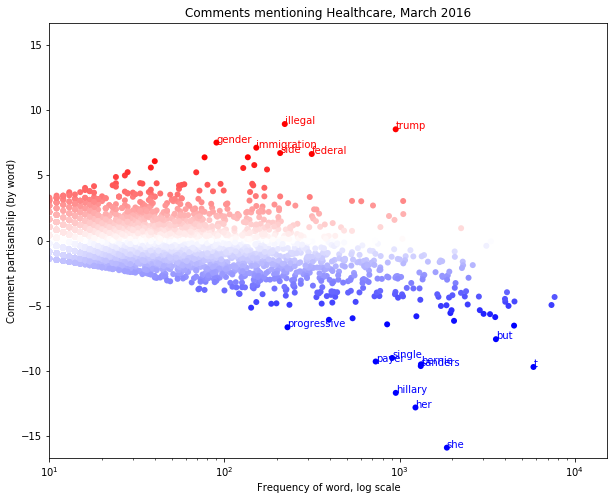

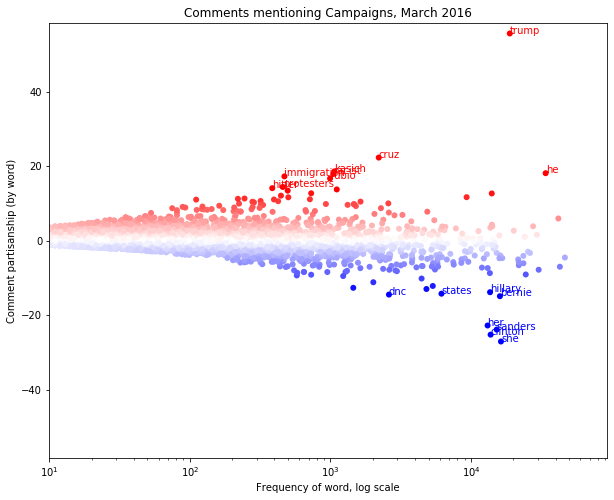

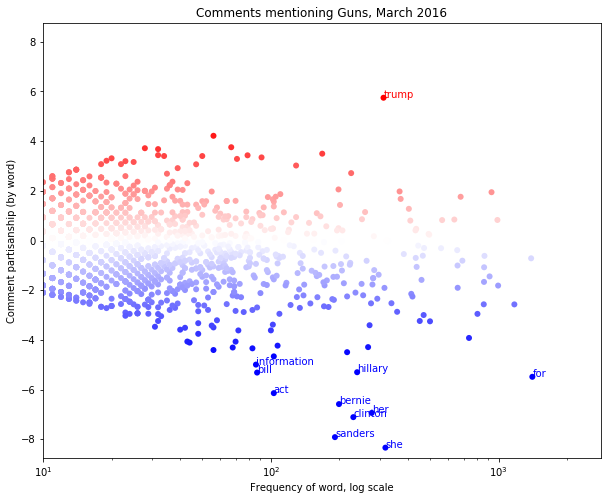

In [23]:
for j in range(len(word_sets)):
    i = 14
    
    tmp_sanders = sanders_tf_subsets[i][j].sum(axis=0).A1
    tmp_trump = trump_tf_subsets[i][j].sum(axis=0).A1
    
    make_plot(tmp_sanders + tmp_trump, fightin_words_lists[i][j], max(
            sorted(fightin_words_lists[i][j])[-10], -1 * sorted(fightin_words_lists[i][j])[10]),
                 'Comment partisanship (by word)', 'Comments mentioning ' + word_set_names[j] + ', March 2016')